# Imports

In [1]:
import iris
import matplotlib as mpl
import numpy as np
from iris.plot import pcolormesh
import iris.analysis.cartography
import iris.plot as iplt
import iris.quickplot as qplt
from iris.coord_systems import GeogCS
import cartopy.crs as ccrs
import cf_units
import cftime
import iris.coord_categorisation
import matplotlib
import matplotlib.pyplot as plt
import iris.quickplot as qplt
from scipy import stats
import numpy.ma as ma
import matplotlib.colors as mcols
import statsmodels.api as sm
from scipy.stats import norm, uniform
import cartopy.feature as cfeature
from collections import OrderedDict 
import xarray as xr
import ascend
import cartopy.io.shapereader as shpreader
from ascend import shape
import glob
import pickle
import pandas as pd
import seaborn as sns

# Read in dataframes

In [42]:
#obs = pd.read_pickle(f'/scratch/cburton/scratch/ISIMIP3a/Data/observation_df.pkl')#3 obs, GFED4.1s, CCI5.1, CCILT11
obs = pd.read_pickle(f'/scratch/cburton/scratch/ISIMIP3a/Data/AR6_obs_df.pkl')#2 obs, CCI5.1 & MCD64

obsclim = pd.read_pickle(f'/scratch/cburton/scratch/ISIMIP3a/Data/AR6_obsclim_df.pkl')
counterclim = pd.read_pickle(f'/scratch/cburton/scratch/ISIMIP3a/Data/AR6_counterclim_df.pkl')

weights = pd.read_pickle(f'/scratch/cburton/scratch/ISIMIP3a/Data/Overlap_Region_Weights.pkl')


# Test out selecting regions etc

In [43]:
print(obs.head)

<bound method NDFrame.head of Region             NWN                                               NEN  \
Observation FireCCI5.1 GFED_500m     GFED5 GFED4.1s FireCCILT11 GFED4.1s   
Date                                                                       
1982-01-01         NaN       NaN       NaN      NaN    0.000000      NaN   
1982-02-01         NaN       NaN       NaN      NaN    0.000000      NaN   
1982-03-01         NaN       NaN       NaN      NaN    0.000082      NaN   
1982-04-01         NaN       NaN       NaN      NaN    0.001313      NaN   
1982-05-01         NaN       NaN       NaN      NaN    0.016706      NaN   
...                ...       ...       ...      ...         ...      ...   
2020-08-01    0.003236  0.007911  0.038820      NaN         NaN      NaN   
2020-09-01    0.009187  0.031002  0.045137      NaN         NaN      NaN   
2020-10-01    0.000134  0.005270  0.086664      NaN         NaN      NaN   
2020-11-01    0.000333  0.030546  0.094774      NaN       

In [10]:
#Select one region and obs dataset
region1 = (obs['NWN', 'FireCCI5.1'])
print(region1)

1982-01-01         NaN
1982-02-01         NaN
1982-03-01         NaN
1982-04-01         NaN
1982-05-01         NaN
                ...   
2020-08-01    0.003236
2020-09-01    0.009187
2020-10-01    0.000134
2020-11-01    0.000333
2020-12-01    0.004621
Name: (NWN, FireCCI5.1), Length: 456, dtype: float64


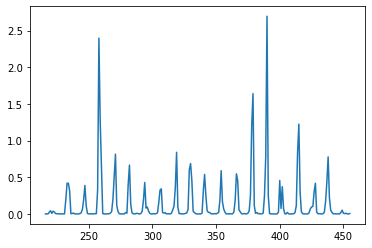

In [11]:
x = np.arange(456)
plt.plot(x,region1)
plt.show()

In [12]:
#Group Globally
obs_global = obs.groupby(by='Observation', axis=1).sum(min_count=1) 
obsclim_global = obsclim.groupby(by='Model', axis=1).sum(min_count=1) 

#Group into years
obs_yearly = obs_global.groupby(obs_global.index.to_period('Y')).sum(min_count=1)



2002    459.794935
2003    483.197011
2004    518.368605
2005    509.406606
2006    479.471650
2007    514.766709
2008    491.627763
2009    440.497671
2010    472.699075
2011    505.844715
2012    500.687602
2013    398.397386
2014    433.914296
2015    438.843082
2016    414.813034
2017    441.387402
2018    415.045796
2019    390.456650
2020    386.720249
Freq: A-DEC, Name: FireCCI5.1, dtype: float64
2002    467.705787
2003    443.222010
2004    466.754612
2005    462.548864
2006    436.204055
2007    468.927468
2008    428.392821
2009    386.597790
2010    421.229551
2011    464.069761
2012    461.521349
2013    361.314158
2014    385.508560
2015    394.262416
2016    374.134841
2017    395.143024
2018    361.228976
2019    353.977661
2020    358.422360
Freq: A-DEC, Name: GFED_500m, dtype: float64


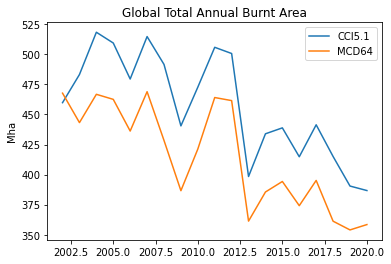

In [13]:
#Plot one obs dataset from annual df
CCI = (obs_yearly['FireCCI5.1'])
obs1 = CCI.iloc[19:38]
print(obs1)
x = np.arange(2002,2021)
plt.plot(x,obs1, label='CCI5.1')

GFED = (obs_yearly['GFED_500m'])
obs2 = GFED.iloc[19:38]
print(obs2)
plt.plot(x,obs2, label='MCD64')
plt.title('Global Total Annual Burnt Area')
plt.ylabel('Mha')

plt.legend()
plt.show()



/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


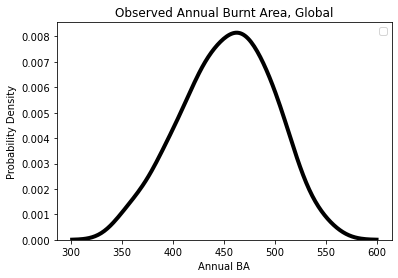

In [14]:
sns.distplot(obs_yearly, hist=False, kde=True, 
                 bins=int(180/5), color = 'k', 
                 hist_kws={'edgecolor':'k'},
                 kde_kws={'linewidth': 4, 'color': 'k'})

plt.legend(ncol=1, loc='best')
plt.title('Observed Annual Burnt Area, Global')
plt.ylabel('Probability Density')
plt.xlabel('Annual BA')
plt.show()

2001    393.808794
2002    459.794935
2003    483.197011
2004    518.368605
2005    509.406606
2006    479.471650
2007    514.766709
2008    491.627763
2009    440.497671
2010    472.699075
2011    505.844715
2012    500.687602
2013    398.397386
2014    433.914296
2015    438.843082
2016    414.813034
Freq: A-DEC, Name: FireCCI5.1, dtype: float64


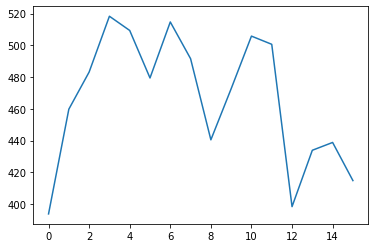

2001           NaN
2002    467.705787
2003    443.222010
2004    466.754612
2005    462.548864
2006    436.204055
2007    468.927468
2008    428.392821
2009    386.597790
2010    421.229551
2011    464.069761
2012    461.521349
2013    361.314158
2014    385.508560
2015    394.262416
2016    374.134841
Freq: A-DEC, Name: GFED_500m, dtype: float64


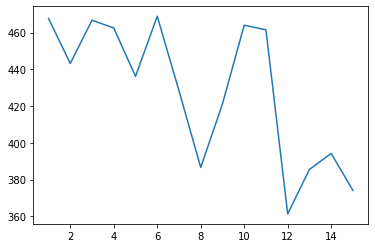

In [15]:
CCI_0216 = (CCI.iloc[18:34])#2002-2016
print(CCI_0216)
x = np.arange(16)
plt.plot(x,CCI_0216)
plt.show()

GFED_0216 = (GFED.iloc[18:34])
print(GFED_0216)
x = np.arange(16)
plt.plot(x,GFED_0216)
plt.show()



/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


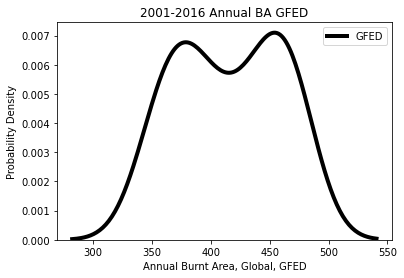

In [16]:
sns.distplot(GFED, hist=False, kde=True, 
                 bins=int(180/5), color = 'k', 
                 hist_kws={'edgecolor':'k'},
                 kde_kws={'linewidth': 4, 'color': 'k', 'label':'GFED'})

plt.legend(ncol=1, loc='best')
plt.xlabel('Annual Burnt Area, Global, GFED')
plt.ylabel('Probability Density')
plt.title('2001-2016 Annual BA GFED')
plt.show()

# Make Anomalies and Relative Anomalies

In [208]:
### ANNUAL
#Create new dataframes - ANNUAL, GLOBAL, 2003-2019
obs_global = obs.groupby(by='Observation', axis=1).sum(min_count=1) 
obs_select2_glob = obs_global[['FireCCI5.1', 'GFED5']]
obs_annual_glob = obs_select2_glob.groupby(obs_select2_glob.index.to_period('Y')).sum(min_count=1)
obs_0319_annual_glob = obs_annual_glob.iloc[20:37]#2003-2019

obsclim_global = obsclim.groupby(by='Model', axis=1).sum(min_count=1) 
obsclim_annual_glob = obsclim_global.groupby(obsclim_global.index.to_period('Y')).sum(min_count=1)
obsclim_0319_annual_glob = obsclim_annual_glob.iloc[102:119]#2003-2019

#Create new dataframes - ANNUAL, GLOBAL, 1982-2019
obs_global = obs.groupby(by='Observation', axis=1).sum(min_count=1) 
obs_annual_glob = obs_global.groupby(obs_global.index.to_period('Y')).sum(min_count=1)
obs_annual_glob_Ranom = (obs_annual_glob - obs_annual_glob.mean()) / obs_annual_glob.mean()

obsclim_global = obsclim.groupby(by='Model', axis=1).sum(min_count=1) 
obsclim_annual_glob = obsclim_global.groupby(obsclim_global.index.to_period('Y')).sum(min_count=1)
obsclim_8219_annual_glob = obsclim_annual_glob.iloc[81:119]#1982-2019
obsclim_8219_annual_glob_Ranom = (obsclim_8219_annual_glob - obsclim_8219_annual_glob.mean()) / obsclim_8219_annual_glob.mean()


#Create new dataframes of anomalies - ANNUAL, GLOBAL, 2002-2019
obs_0319_annual_glob_anom = obs_0319_annual_glob - obs_0319_annual_glob.mean()
obsclim_0319_annual_glob_anom = obsclim_0319_annual_glob - obsclim_0319_annual_glob.mean()

#Create new dataframes of RELATIVE anomalies - ANNUAL, GLOBAL, 2002-2019
obs_0319_annual_glob_Ranom = (obs_0319_annual_glob - obs_0319_annual_glob.mean()) / obs_0319_annual_glob.mean()
obsclim_0319_annual_glob_Ranom = (obsclim_0319_annual_glob - obsclim_0319_annual_glob.mean())/obsclim_0319_annual_glob.mean()

#Create new dataframes of RELATIVE anomalies - ANNUAL, GLOBAL, 1901-2019
obs_annual_glob_Ranom = (obs_annual_glob - obs_annual_glob.mean()) / obs_annual_glob.mean()
obsclim_annual_glob_Ranom = (obsclim_annual_glob - obsclim_annual_glob.mean())/obsclim_annual_glob.mean()


#Create new dataframes of RELATIVE anomalies - ANNUAL, REGIONAL, 2003-2019
obs_annual_Reg = obs.groupby(obs.index.to_period('Y')).sum(min_count=1)
obs_0319_annual_Reg = obs_annual_Reg.iloc[20:37]#2003-2019
obs_0319_annual_Reg_Ranom = (obs_0319_annual_Reg - obs_0319_annual_Reg.mean()) / obs_0319_annual_Reg.mean()

obsclim_annual_Reg = obsclim.groupby(obsclim.index.to_period('Y')).sum(min_count=1)
obsclim_0319_annual_Reg = obsclim_annual_Reg.iloc[20:37]#2003-2019
obsclim_0319_annual_Reg_Ranom = (obsclim_0319_annual_Reg - obsclim_0319_annual_Reg.mean()) / obsclim_0319_annual_Reg.mean()


### MONTHLY
#Create new dataframes of anom, Ranom, z-score - MONTHLY, GLOBAL
obs_0319_glob = obs_global.iloc[240:444]#2003-2019
obs_0319_anom_glob = obs_0319_glob - obs_0319_glob.mean()
obs_0319_Ranom_glob = (obs_0319_glob - obs_0319_glob.mean()) / obs_0319_glob.mean()
obs_zscore_glob = (obs_0319_glob - obs_0319_glob.mean()) / obs_0319_glob.std()

obsclim_0319_glob = obsclim_global.iloc[1224:1428]#2003-2019
obsclim_0319_anom_glob = obsclim_0319_glob - obsclim_0319_glob.mean()
obsclim_0319_Ranom_glob = (obsclim_0319_glob - obsclim_0319_glob.mean()) / obsclim_0319_glob.mean()
obsclim_0319_zscore_glob = (obsclim_0319_glob - obsclim_0319_glob.mean()) / obsclim_0319_glob.std()


#monthly output by region
obs_0319 = obs.iloc[240:444]#2003-2019
obsclim_0319 = obsclim.iloc[1224:1428]#2003-2019

#obsclim_0319_Danom = obsclim_0319.mean() / obs_0319.mean()
#obs_0319_Danom = obs_0319.mean() / obs_0319.mean()


#RELATIVE ANOMALY monthly by region
obs_0319_Ranom = (obs_0319 - obs_0319.mean())/obs_0319.mean()
obsclim_0319_Ranom = (obsclim_0319 - obsclim_0319.mean())/obsclim_0319.mean()


#Global, monthly, drop VISIT
obsclim_0319_glob_noVISIT = obsclim_0319_glob.drop(['VISIT'], axis=1) 

counterclim_0319 = counterclim.iloc[1212:1428]#2003-2019
counterclim_0319_glob = counterclim_0319.groupby(by='Model', axis=1).sum(min_count=1) 
counterclim_0319_glob_noVISIT = counterclim_0319_glob.drop(['VISIT'], axis=1) 



#Plot burnt area Pre-Industrial monthly GLOBAL
obsclim_0319_Ranom_glob_noVISIT = (obsclim_0319_glob_noVISIT - obsclim_0319_glob_noVISIT.mean())/obsclim_0319_glob_noVISIT.mean()   
counterclim_0319_Ranom_glob_noVISIT = (counterclim_0319_glob_noVISIT - counterclim_0319_glob_noVISIT.mean())/counterclim_0319_glob_noVISIT.mean()

obsclim_PI = obsclim.iloc[0:228]#1901-1920
counterclim_PI = counterclim.iloc[0:228]#1901-1920

obsclim_global_PI = obsclim_PI.groupby(by='Model', axis=1).sum(min_count=1)
obsclim_global_PI_noVISIT = obsclim_global_PI.drop(['VISIT'], axis=1) 

counterclim_global_PI = counterclim_PI.groupby(by='Model', axis=1).sum(min_count=1) 
counterclim_global_PI_noVISIT = counterclim_global_PI.drop(['VISIT'], axis=1) 

obsclim_PI_Ranom_glob_noVISIT = (obsclim_global_PI_noVISIT - obsclim_global_PI_noVISIT.mean()) / obsclim_global_PI_noVISIT.mean()
counterclim_PI_Ranom_glob_noVISIT = (counterclim_global_PI_noVISIT - counterclim_global_PI_noVISIT.mean()) / counterclim_global_PI_noVISIT.mean()

#Plot burnt area monthly GLOBAL 1901-2019
obsclim_global_long = obsclim.groupby(by='Model', axis=1).sum(min_count=1)
obsclim_global_long_noVISIT = obsclim_global_long.drop(['VISIT'], axis=1) 

counterclim_global_long = counterclim.groupby(by='Model', axis=1).sum(min_count=1) 
counterclim_global_long_noVISIT = counterclim_global_long.drop(['VISIT'], axis=1) 


#Plot burnt area  monthly GLOBAL 1950-2019
obsclim_1950 = obsclim.iloc[828:1428]#1950-2019
counterclim_1950 = counterclim.iloc[828:1428]#1950-2019

obsclim_global_1950 = obsclim_1950.groupby(by='Model', axis=1).sum(min_count=1)
obsclim_global_1950_noVISIT = obsclim_global_1950.drop(['VISIT'], axis=1) 

counterclim_global_1950 = counterclim_1950.groupby(by='Model', axis=1).sum(min_count=1) 
counterclim_global_1950_noVISIT = counterclim_global_1950.drop(['VISIT'], axis=1) 

obsclim_1950_Ranom_glob_noVISIT = (obsclim_global_1950_noVISIT - obsclim_global_1950_noVISIT.mean()) / obsclim_global_1950_noVISIT.mean()
counterclim_1950_Ranom_glob_noVISIT = (counterclim_global_1950_noVISIT - counterclim_global_1950_noVISIT.mean()) / counterclim_global_1950_noVISIT.mean()



# Time series

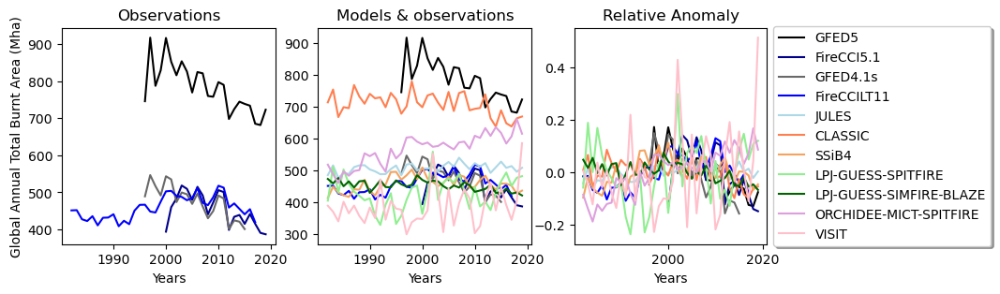

In [67]:
obscolors= ('white','black', 'darkblue', 'dimgrey','blue') 
AllObs = ['GFED5','FireCCI5.1','GFED4.1s', 'FireCCILT11', ]


fig = plt.figure(figsize=(10,3))
ax = fig.add_subplot(1,3,1)
x1 = np.arange(1982,2020)
n=1
for Data in AllObs:
    ax.plot(x1,obs_annual_glob[Data], color = obscolors[n % len(obscolors)], label=Data)
    n = n+1
plt.xlabel('Years')
plt.ylabel('Global Annual Total Burnt Area (Mha)')
plt.title('Observations')


ax2 = fig.add_subplot(1,3,2)
x = np.arange(1901,2020)
n=1
for Data in AllObs:
    ax2.plot(x1,obs_annual_glob[Data], color = obscolors[n % len(obscolors)], label=Data)
    n = n+1
modelcolors= ('white','lightblue', 'coral', 'sandybrown', 'lightgreen','darkgreen', 'plum', 'pink') 
AllModels = ['JULES', 'CLASSIC', 'SSiB4', 'LPJ-GUESS-SPITFIRE','LPJ-GUESS-SIMFIRE-BLAZE', 'ORCHIDEE-MICT-SPITFIRE', 'VISIT']
n=1
for Data in AllModels:
    ax2.plot(x1,obsclim_8219_annual_glob[Data], color = modelcolors[n % len(modelcolors)], label=Data)
    n = n+1
plt.xlabel('Years')
plt.title('Models & observations')


ax3 = fig.add_subplot(1,3,3)
n=1
for Data in AllObs:
    ax3.plot(x1,obs_annual_glob_Ranom[Data], color = obscolors[n % len(obscolors)], label=Data)
    n = n+1
n=1
for Data in AllModels:
    ax3.plot(x1,obsclim_8219_annual_glob_Ranom[Data], color = modelcolors[n % len(modelcolors)], label=Data)
    n = n+1
box = ax3.get_position()
ax3.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax3.legend(bbox_to_anchor=(1.0, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)
plt.xlabel('Years')
plt.title('Relative Anomaly')
plt.show()

# Validation PDF (Annual, Global)

/var/tmp/ipykernel_51520/2911906556.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_annual_glob_Ranom[Data], hist=False, kde=True,
/var/tmp/ipykernel_51520/2911906556.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_annual_glob_Ranom[Data], hist=False, 

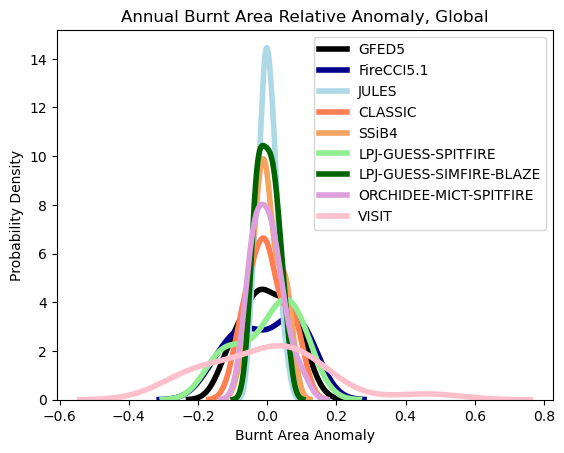

NameError: name 'obs_Ranom' is not defined

In [82]:
####Validation PDF annual global, anomaly and Ranomaly
#obscolors= ('white','black', 'blue', 'darkblue') 
#AllObs = ['GFED4.1s', 'FireCCI5.1', 'FireCCILT11']
obscolors= ('white','black', 'darkblue') 
AllObs = ['GFED5', 'FireCCI5.1']

n=1
for Data in AllObs:
    sns.distplot(obs_0319_annual_glob_Ranom[Data], hist=False, kde=True, 
                 bins=int(180/5), color = obscolors[n % len(obscolors)], 
                 hist_kws={'edgecolor':obscolors[n % len(obscolors)]},
                 kde_kws={'linewidth': 4, 'color': obscolors[n % len(obscolors)], 'label':Data})
    n = n+1

modelcolors= ('white','lightblue', 'coral', 'sandybrown', 'lightgreen','darkgreen', 'plum', 'pink') 
AllModels = ['JULES', 'CLASSIC', 'SSiB4', 'LPJ-GUESS-SPITFIRE','LPJ-GUESS-SIMFIRE-BLAZE', 'ORCHIDEE-MICT-SPITFIRE', 'VISIT']
n=1
for Data in AllModels:
    sns.distplot(obsclim_0319_annual_glob_Ranom[Data], hist=False, kde=True, 
                 bins=int(180/5), color = modelcolors[n % len(modelcolors)], 
                 hist_kws={'edgecolor':modelcolors[n % len(modelcolors)]},
                 kde_kws={'linewidth': 4, 'color': modelcolors[n % len(modelcolors)], 'label':Data})
    n = n+1


plt.legend(ncol=1, loc='best')
plt.xlabel('Burnt Area Anomaly')
plt.ylabel('Probability Density')
plt.title('Annual Burnt Area Relative Anomaly, Global')
plt.show()


n=1
for Data in AllObs:
    sns.distplot(obs_Ranom[Data], hist=False, kde=True, 
                 bins=int(180/5), color = obscolors[n % len(obscolors)], 
                 hist_kws={'edgecolor':obscolors[n % len(obscolors)]},
                 kde_kws={'linewidth': 4, 'color': obscolors[n % len(obscolors)], 'label':Data})
    n = n+1

n=1
for Data in AllModels:
    sns.distplot(obsclim_Ranom[Data], hist=False, kde=True, 
                 bins=int(180/5), color = modelcolors[n % len(modelcolors)], 
                 hist_kws={'edgecolor':modelcolors[n % len(modelcolors)]},
                 kde_kws={'linewidth': 4, 'color': modelcolors[n % len(modelcolors)], 'label':Data})
    n = n+1


plt.legend(ncol=1, loc='best')
plt.xlabel('Burnt Area Relative Anomaly')
plt.ylabel('Probability Density')
plt.title('Annual Burnt Area Relative Anomaly, Global')
plt.show()

# Validation PDF M Relative Anomaly (Monthly, Global)

/var/tmp/ipykernel_51520/473088230.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True,
/var/tmp/ipykernel_51520/473088230.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True,
/var/t

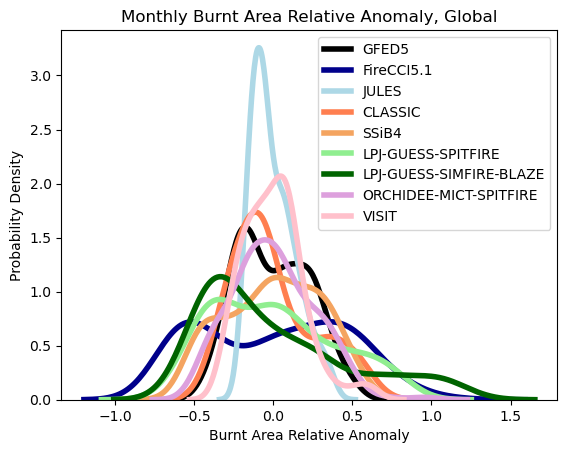

In [83]:

n=1
for Data in AllObs:
    sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True, 
                 bins=int(180/5), color = obscolors[n % len(obscolors)], 
                 hist_kws={'edgecolor':obscolors[n % len(obscolors)]},
                 kde_kws={'linewidth': 4, 'color': obscolors[n % len(obscolors)], 'label':Data})
    n = n+1


n=1
for Data in AllModels:
    sns.distplot(obsclim_0319_Ranom_glob[Data], hist=False, kde=True, 
                 bins=int(180/5), color = modelcolors[n % len(modelcolors)], 
                 hist_kws={'edgecolor':modelcolors[n % len(modelcolors)]},
                 kde_kws={'linewidth': 4, 'color': modelcolors[n % len(modelcolors)], 'label':Data})
    n = n+1


plt.legend(ncol=1, loc='best')
plt.xlabel('Burnt Area Relative Anomaly')
plt.ylabel('Probability Density')
plt.title('Monthly Burnt Area Relative Anomaly, Global')
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Validation/GlobalMonthly_Ranom.png',facecolor='w', transparent=False)    
plt.show()

# Monthly PDF by region - testing different anoms

NWN


KeyError: 'CLASSIC'

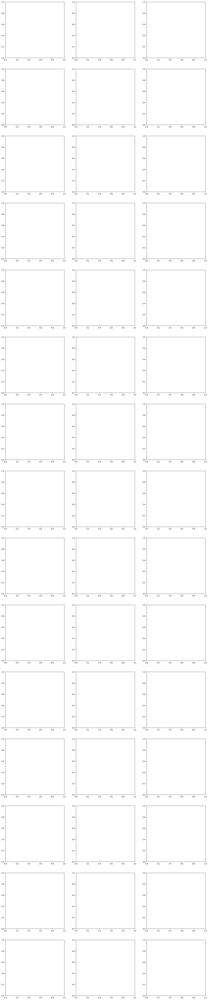

In [210]:

obs_colours= {'GFED5':'black', 'FireCCI5.1':'darkblue'} 

#grey = sns.color_palette("Greys", 10)
#obs_colours = {'FireCCI5.1': grey[9], 
#              'FireCCILT11': grey[7], 
#              'GFED4.1s': grey[4]}
model_colours = {'JULES': 'lightblue', 
              'CLASSIC': 'coral', 
              'SSiB4': 'sandybrown',
              'LPJ-GUESS-SPITFIRE': 'lightgreen',
            'LPJ-GUESS-SIMFIRE-BLAZE': 'darkgreen',
            'ORCHIDEE-MICT-SPITFIRE':'plum',
             'VISIT':'pink'}

#obs_0319_Danom = obs_0319.mean() / obs_0319.mean()



fig, axs = plt.subplots(15, 3, figsize=(20, 100))
axs = axs.ravel()
    
for idx, regionname in enumerate(obs_0319.columns.unique(level='Region')):
    print(regionname)
    ax = axs[idx]
    for model_name in obsclim_0319[regionname].columns:
        if model_name != 'VISIT':
            data = obsclim_0319[regionname][model_name].mean() / obs_0319[regionname][model_name].mean()
            sns.distplot(data, hist=False, kde=True, ax=ax,  label=model_name, kde_kws={'linewidth': 4,'color':model_colours[model_name]})    
    for obs_name in obs_0319[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            data = obs_0319[regionname][obs_name].mean() / obs_0319[regionname][model_name].mean()
            sns.distplot(data, hist=False, kde=True, ax=ax,  label=obs_name, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
    ax.set_xlabel('Burnt Area')
    ax.set_title(regionname)
    ax.legend() 
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/PDF_Validation_AR6regions_Abs.png',facecolor='w', transparent=False)    
plt.show()





# Validation PDF (Monthly, Regions, Relative Anomaly)

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:23: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True, label=obs_name, ax=ax, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
/var/tmp/ipykernel_51520/3574965226.py:23: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.di

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:23: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:23: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:23: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/3574965226.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

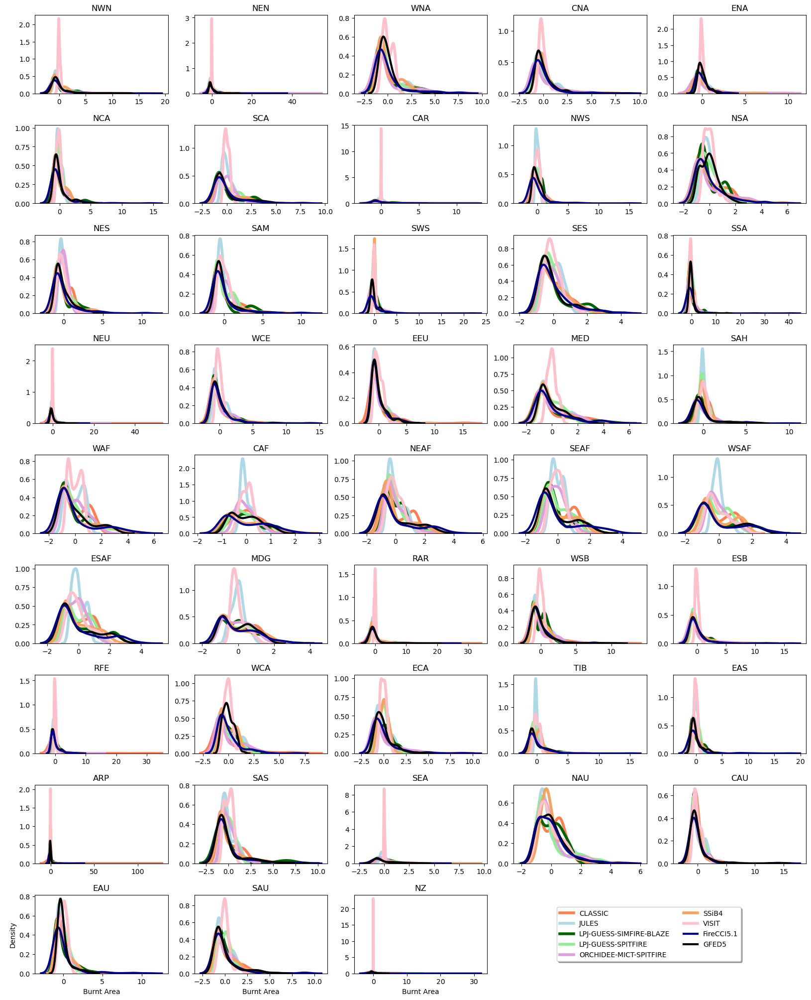

In [86]:
obs_colours= {'GFED5':'black', 'FireCCI5.1':'darkblue'} 

model_colours = {'JULES': 'lightblue', 
              'CLASSIC': 'coral', 
              'SSiB4': 'sandybrown',
              'LPJ-GUESS-SPITFIRE': 'lightgreen',
            'LPJ-GUESS-SIMFIRE-BLAZE': 'darkgreen',
            'ORCHIDEE-MICT-SPITFIRE':'plum',
             'VISIT':'pink'}

fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()

for idx, regionname in enumerate(obsclim_0319_Ranom.columns.unique(level='Region')):
    ax = axs[idx]
    for model_name in obsclim_0319_Ranom[regionname].columns: 
        #if model_name != 'VISIT':    
            data = obsclim_0319_Ranom[regionname][model_name]
            sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})                
    for obs_name in obs_0319_Ranom[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            data = obs_0319_Ranom[regionname][obs_name]
            sns.distplot(data, hist=False, kde=True, label=obs_name, ax=ax, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
    ax.set_title(regionname)
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=2)

for ax in axs[40:44]:
    ax.set_xlabel('Burnt Area')
ax = axs[40]
ax.set_ylabel('Density')
plt.subplots_adjust(hspace=0.4)
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/AR6regions_Ranom_wVISIT.png',facecolor='w', transparent=False)    
plt.show()


# Validation PDF (Monthly, Regions, Relative Anomaly) - Selected Regions

/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

/var/tmp/ipykernel_61892/1712001909.py:30: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True, label=obs_name, ax=ax, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
/var/tmp/ipykernel_61892/1712001909.py:30: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.di

/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_61892/1712001909.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 

KeyError: 'GFED_500m'

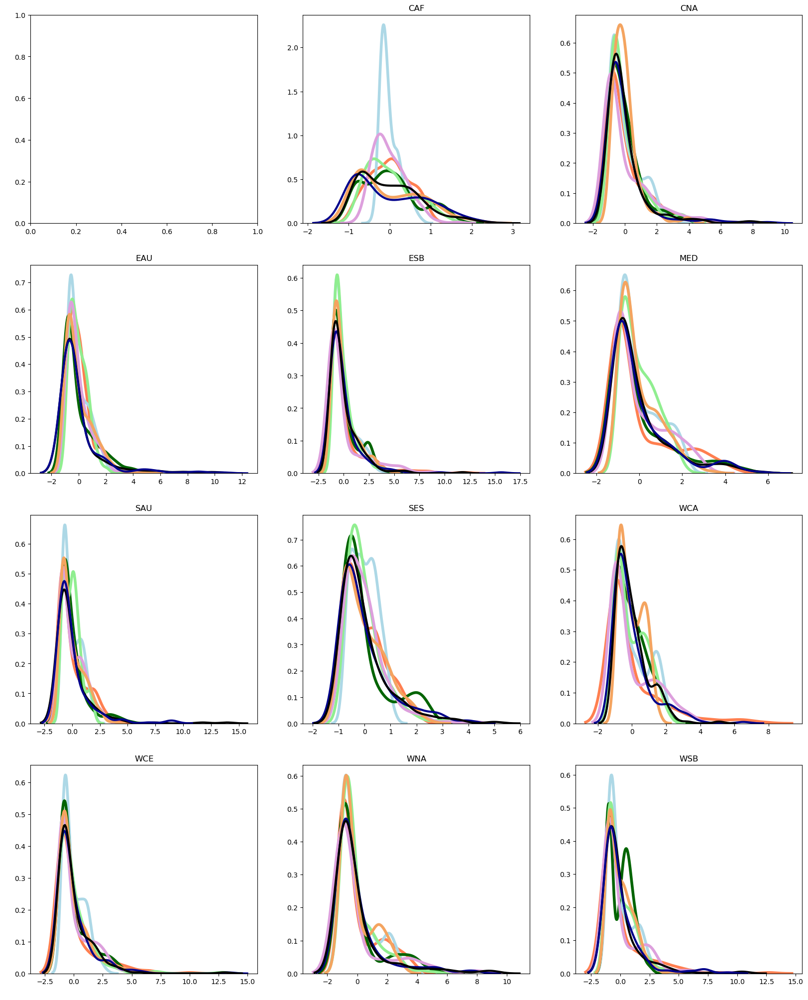

In [66]:

obscolors= ('white','black', 'darkblue') 
AllObs = ['GFED_500m', 'FireCCI5.1']
modelcolors= ('white','lightblue', 'coral', 'sandybrown', 'lightgreen','darkgreen', 'plum', 'pink') 
AllModels = ['JULES', 'CLASSIC', 'SSiB4', 'LPJ-GUESS-SPITFIRE','LPJ-GUESS-SIMFIRE-BLAZE', 'ORCHIDEE-MICT-SPITFIRE', 'VISIT']

model_colours = {'JULES': 'lightblue', 
              'CLASSIC': 'coral', 
              'SSiB4': 'sandybrown',
              'LPJ-GUESS-SPITFIRE': 'lightgreen',
            'LPJ-GUESS-SIMFIRE-BLAZE': 'darkgreen',
            'ORCHIDEE-MICT-SPITFIRE':'plum',
             'VISIT':'pink'}


fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
SelectedRegions = ['CAF', 'CNA', 'EAU', 'ESB', 'MED', 'SAU', 'SES', 'WCA', 'WCE', 'WNA', 'WSB']


for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    for model_name in obsclim_0219_Ranom[regionname].columns: 
        if model_name != 'VISIT':    
            data = obsclim_0219_Ranom[regionname][model_name]
            sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})                
    for obs_name in obs_0219_Ranom[regionname].columns:
        if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
            data = obs_0219_Ranom[regionname][obs_name]
            sns.distplot(data, hist=False, kde=True, label=obs_name, ax=ax, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ') 



ax = axs[0]
n=1
for Data in AllObs:
    sns.distplot(obs_0219_Ranom[Data], hist=False, kde=True, ax=ax,
                 color = obscolors[n % len(obscolors)], 
                 hist_kws={'edgecolor':obscolors[n % len(obscolors)]},
                 kde_kws={'linewidth': 4, 'color': obscolors[n % len(obscolors)], 'label':Data})
    n = n+1
    
n=1
for Data in AllModels:
    sns.distplot(obsclim_0219_Ranom[Data], hist=False, kde=True, ax=ax,
                 color = modelcolors[n % len(modelcolors)], 
                 hist_kws={'edgecolor':modelcolors[n % len(modelcolors)]},
                 kde_kws={'linewidth': 4, 'color': modelcolors[n % len(modelcolors)], 'label':Data})
    n = n+1        
ax.legend() 
ax.set_xlabel(' ')
ax.set_ylabel(' ') 
ax.set_title('Global')

for ax in axs[9:12]:
    ax.set_xlabel('Burnt Area') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('Density') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Validation/AR6regions_Selected.png',facecolor='w', transparent=False)    
plt.show()

# Attribution PDF (Monthly, Global, 2002-2019, and PI 1901-1920)

/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


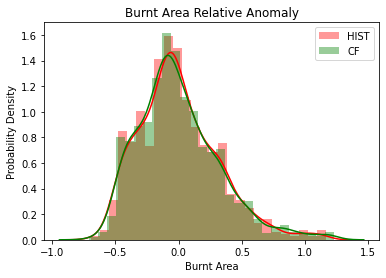

/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


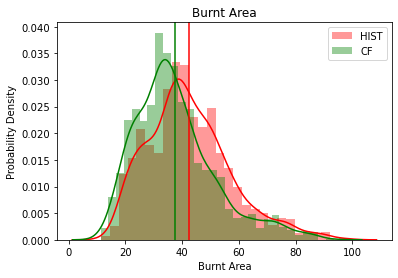

Stat =  KstestResult(statistic=0.2013888888888889, pvalue=2.1161689044989862e-23)
Risk Ratio =  1.428822495606327


/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


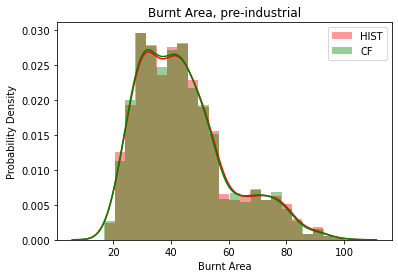

Stat PI =  KstestResult(statistic=0.014619883040935672, pvalue=0.9985936784090819)
Risk Ratio PI=  1.0136518771331058


In [133]:
#Attribution PDF
#Plot burnt area and Ranom monthly GLOBAL

 
sns.distplot(obsclim_RelAnom, kde=True, color="red",label='HIST',fit_kws={"linewidth":2.5,"color":"darkred"})
sns.distplot(counterclim_RelAnom, kde=True, color="green",label='CF',fit_kws={"linewidth":2.5,"color":"darkgreen"})
plt.title('Burnt Area Relative Anomaly')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.show()

sns.distplot(obsclim_global, kde=True, color="red",label='HIST',fit_kws={"linewidth":2.5,"color":"darkred"})
sns.distplot(counterclim_global, kde=True, color="green",label='CF',fit_kws={"linewidth":2.5,"color":"darkgreen"})
plt.axvline(x=np.nanmean(obsclim_global) , color='red')
plt.axvline(x=np.nanmean(counterclim_global), color='green')
plt.title('Burnt Area')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Global_woVISIT.png',facecolor='w', transparent=False)    
plt.show()

test1=(obsclim_global_noVISIT.to_numpy())
test2=(counterclim_global_noVISIT.to_numpy())
stat = stats.kstest(test1.ravel(), test2.ravel())
print('Stat = ', stat)  
ALL = (np.count_nonzero(obsclim_global_noVISIT> (np.nanmean(counterclim_global_noVISIT))))
NAT = (np.count_nonzero(counterclim_global_noVISIT > (np.nanmean(counterclim_global_noVISIT))))
RR = ALL/NAT
print('Risk Ratio = ', RR)




sns.distplot(obsclim_global_PI_noVISIT, kde=True, color="red",label='HIST',fit_kws={"linewidth":2.5,"color":"darkred"})
sns.distplot(counterclim_global_PI_noVISIT, kde=True, color="green",label='CF',fit_kws={"linewidth":2.5,"color":"darkgreen"})
plt.title('Burnt Area, pre-industrial')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Global_PI_woVISIT.png',facecolor='w', transparent=False)    
plt.show()

test3=(obsclim_global_PI_noVISIT.to_numpy())
test4=(counterclim_global_PI_noVISIT.to_numpy())
statPI = stats.kstest(test3.ravel(), test4.ravel())
print('Stat PI = ', statPI)  
ALL_PI = (np.count_nonzero(obsclim_global_PI_noVISIT> (np.nanmean(counterclim_global_PI_noVISIT))))
NAT_PI = (np.count_nonzero(counterclim_global_PI_noVISIT > (np.nanmean(counterclim_global_PI_noVISIT))))
RR_PI = ALL_PI/NAT_PI
print('Risk Ratio PI= ', RR_PI)


# Attribution PDF (Monthly, Global, 1901-2019, and 1950-2019)

8568
Stat Long =  KstestResult(statistic=0.09056956115779645, pvalue=5.468595122858981e-31)
Risk Ratio Long =  1.1874486160591944


/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


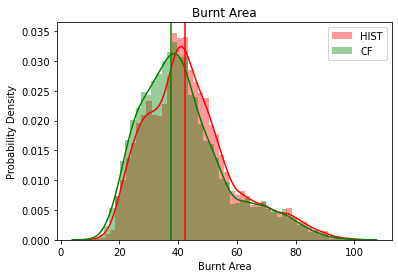

Stat 1950 =  KstestResult(statistic=0.1711111111111111, pvalue=2.0177785861563415e-46)
Risk Ratio 1950=  1.3905440414507773


/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


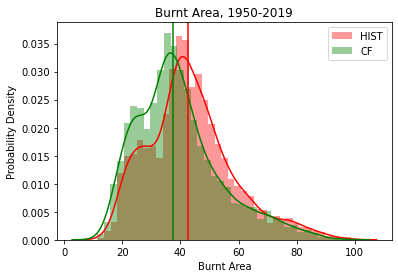

In [23]:
#Attribution PDF


testa=(obsclim_global_long_noVISIT.to_numpy())
testb=(counterclim_global_long_noVISIT.to_numpy())
statL = stats.kstest(testa.ravel(), testb.ravel())
print(len(testa.ravel()))
print('Stat Long = ', statL)  
ALL_Long = (np.count_nonzero(obsclim_global_long_noVISIT> (np.nanmean(counterclim_global_long_noVISIT))))
NAT_Long = (np.count_nonzero(counterclim_global_long_noVISIT > (np.nanmean(counterclim_global_long_noVISIT))))
RR_Long = ALL_Long/NAT_Long
print('Risk Ratio Long = ', RR_Long)

sns.distplot(obsclim_global_long_noVISIT, kde=True, color="red",label='HIST',fit_kws={"linewidth":2.5,"color":"darkred"})
sns.distplot(counterclim_global_long_noVISIT, kde=True, color="green",label='CF',fit_kws={"linewidth":2.5,"color":"darkgreen"})
plt.axvline(x=np.nanmean(obsclim_global) , color='red')
plt.axvline(x=np.nanmean(counterclim_global), color='green')
plt.title('Burnt Area')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Global_1901-2019_woVISIT.png',facecolor='w', transparent=False)    
plt.show()



test5=(obsclim_global_1950_noVISIT.to_numpy())
test6=(counterclim_global_1950_noVISIT.to_numpy())
stat1950 = stats.kstest(test5.ravel(), test6.ravel())
print('Stat 1950 = ', stat1950)  
ALL_1950 = (np.count_nonzero(obsclim_global_1950_noVISIT> (np.nanmean(counterclim_global_1950_noVISIT))))
NAT_1950 = (np.count_nonzero(counterclim_global_1950_noVISIT > (np.nanmean(counterclim_global_1950_noVISIT))))
RR_1950 = ALL_1950/NAT_1950
print('Risk Ratio 1950= ', RR_1950)

sns.distplot(obsclim_global_1950_noVISIT, kde=True, color="red",label='HIST',fit_kws={"linewidth":2.5,"color":"darkred"})
sns.distplot(counterclim_global_1950_noVISIT, kde=True, color="green",label='CF',fit_kws={"linewidth":2.5,"color":"darkgreen"})
plt.axvline(x=np.nanmean(obsclim_global) , color='red')
plt.axvline(x=np.nanmean(counterclim_global), color='green')
plt.title('Burnt Area, 1950-2019')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Global_1950_woVISIT.png',facecolor='w', transparent=False)    
plt.show()






# Attribution PDF Global for Land Use Change (monthly, counterfactual 1901-1920 vs 2002-2019)

Stat LUC =  KstestResult(statistic=0.1477014294996751, pvalue=3.919314447540208e-13)
Risk Ratio LUC=  0.9709897610921502


/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/scitools/conda/deployments/default-2022_07_26/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


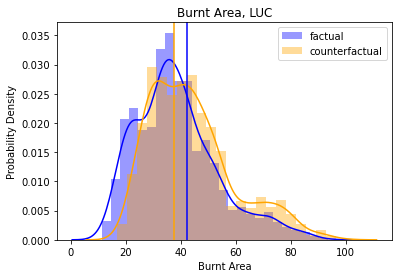

In [121]:
#Attribution PDF for LUC

counterclim_global_PI_noVISIT
counterclim_global_noVISIT

testLUC1=(counterclim_global_PI_noVISIT.to_numpy())
testLUC2=(counterclim_global_noVISIT.to_numpy())
statLUC = stats.kstest(testLUC1.ravel(), testLUC2.ravel())
print('Stat LUC = ', statLUC)  
ALL_LUC = (np.count_nonzero(counterclim_global_noVISIT> (np.nanmean(counterclim_global_noVISIT))))
NAT_LUC = (np.count_nonzero(counterclim_global_PI_noVISIT > (np.nanmean(counterclim_global_PI_noVISIT))))
RR_LUC = ALL_LUC/NAT_LUC
print('Risk Ratio LUC= ', RR_LUC)

sns.distplot(counterclim_global_noVISIT, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_PI_noVISIT, kde=True, color="orange",label='counterfactual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_global) , color='blue')
plt.axvline(x=np.nanmean(counterclim_global), color='orange')
plt.title('Burnt Area, LUC')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.legend()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Global_LUC_woVISIT.png',facecolor='w', transparent=False)    
plt.show()


# Apply Model Weighting - Global bootstrap 

/var/tmp/ipykernel_51520/3491465440.py:16: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_unweighted, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
/var/tmp/ipykernel_51520/3491465440.py:17: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_u

9997
Empirical mean HIST: 42.46141398457623
Empirical mean HISTNAT: 37.49470614756226
Bootstrap replicates mean HIST: 41.287716
Bootstrap replicates mean HISTNAT: 40.209965
The confidence interval for obsclim:  [19.83677673 82.50167847]
The confidence interval for counterclim:  [20.73485947 78.92805099]


/var/tmp/ipykernel_51520/3491465440.py:79: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})


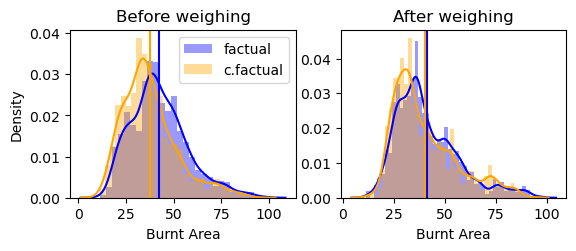

Stat =  KstestResult(statistic=0.11683505051515454, pvalue=8.001381477853173e-60, statistic_location=34.41684, statistic_sign=-1)
Risk Ratio =  1.0690872415532022


In [35]:

Weights = weights

#Global
obsclim_unweighted = []
for model_name in obsclim_0219_glob:
    for i in (obsclim_0219_glob[model_name]):
        obsclim_unweighted.append(i)
        
counterclim_unweighted = []
for model_name in obsclim_0219_glob:
    for i in (counterclim_0219_glob[model_name]):
        counterclim_unweighted.append(i)

#Plot before weighting
plt.subplot(2,2,1)
sns.distplot(obsclim_unweighted, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_unweighted, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_unweighted) , color='blue')
plt.axvline(x=np.nanmean(counterclim_unweighted), color='orange')
plt.xlabel('Burnt Area')
plt.title('Before weighing')
plt.legend(loc='best')  
 
def draw_bs_replicates(data,size):
    """creates a bootstrap sample, computes replicates and returns replicates array"""
    # Create an empty array to store replicates
    bs_replicates = np.empty(size)
    bs_sample = np.random.choice(data,size=size)
    return bs_sample

#Global Weighting
#Draw n bootstrap replicates multiplied by the weight of the model (10,000=1.0, 1000=0.1)
ObsclimArray = []
CounterclimArray = []

for model_name in obsclim_0219_glob: 
    ObsclimArray.append(draw_bs_replicates(obsclim_0219_glob[model_name], np.int(10000*Weights['Global'][model_name][0])))   
for model_name in counterclim_0219_glob:
    CounterclimArray.append(draw_bs_replicates(counterclim_0219_glob[model_name],  np.int(10000*Weights['Global'][model_name][0])))

Obsclim = []
for n in np.arange(0,7):
    for i in ObsclimArray[n]:
        Obsclim.append(i)

Counterclim = []
for n in np.arange(0,7):
    for i in CounterclimArray[n]:
        Counterclim.append(i)

print(len(Obsclim))
### Print empirical mean 
print("Empirical mean HIST: " + str(np.mean(np.array(obsclim_unweighted))))
print("Empirical mean HISTNAT: " + str(np.mean(np.array(counterclim_unweighted))))
## Print the mean of bootstrap replicates
print("Bootstrap replicates mean HIST: " + str(np.mean(Obsclim)))
print("Bootstrap replicates mean HISTNAT: " + str(np.mean(Counterclim)))


# Showing the related percentiles
x1 = np.percentile(Obsclim,[2.5])
x2 = np.percentile(Obsclim,[97.5])
x3 = np.percentile(Obsclim,[66])
x4 = np.percentile(Counterclim,[2.5])
x5 = np.percentile(Counterclim,[97.5])
x6 = np.percentile(Counterclim,[66])

# Get the corresponding values of 2.5th and 97.5th percentiles
conf_interval_HIST = np.percentile(Obsclim,[2.5,97.5])
conf_interval_HISTNAT = np.percentile(Counterclim,[2.5,97.5])

# Print the interval
print("The confidence interval for obsclim: ",conf_interval_HIST)
print("The confidence interval for counterclim: ",conf_interval_HISTNAT)
    
#Plot after weighting - my way
plt.subplot(2,2,2)
sns.distplot(Obsclim, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(Counterclim, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(Obsclim) , color='blue')
plt.axvline(x=np.nanmean(Counterclim), color='orange')

#plt.axvline(x=x1, ymin=0, ymax=1,label='2.5th percentile '+str("%.4f" % x1),c='y', ls='dashed')
#plt.axvline(x=x2, ymin=0, ymax=1,label='97.5th percentile '+str("%.4f" % x2),c='r', ls='dashed')
#plt.axvline(x=x3, ymin=0, ymax=1,label='66th percentile '+str("%.4f" % x3),c='g', ls='dashed')
#plt.axvline(x=x4, ymin=0, ymax=1,label='2.5th percentile '+str("%.4f" % x4),c='y')
#plt.axvline(x=x5, ymin=0, ymax=1,label='97.5th percentile '+str("%.4f" % x5),c='r')
#plt.axvline(x=x6, ymin=0, ymax=1,label='66th percentile '+str("%.4f" % x6),c='g')

plt.xlabel('Burnt Area')
plt.ylabel(' ')
plt.title('After weighing')
plt.show()


test1=Obsclim
test2=Counterclim
stat = stats.kstest(test1, test2) 
print('Stat = ', stat)  
ALL = (np.count_nonzero(Obsclim> (np.nanmean(Counterclim))))
NAT = (np.count_nonzero(Counterclim > (np.nanmean(Counterclim))))
RR = ALL/NAT
print('Risk Ratio = ', RR)

# Test different ways of producing histogram 

/var/tmp/ipykernel_51520/584781113.py:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219_glob, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
/var/tmp/ipykernel_51520/584781113.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_0219

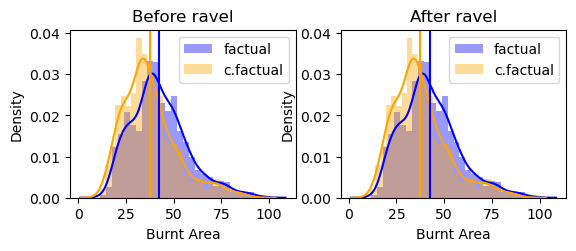

In [19]:

#Global
obsclim_unweighted = []
for model_name in obsclim_0219_glob:
    for i in (obsclim_0219_glob[model_name]):
        obsclim_unweighted.append(i)
        
counterclim_unweighted = []
for model_name in obsclim_0219_glob:
    for i in (counterclim_0219_glob[model_name]):
        counterclim_unweighted.append(i)

#Plot before weighting
plt.subplot(2,2,1)
sns.distplot(obsclim_0219_glob, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_0219_glob, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_0219_glob) , color='blue')
plt.axvline(x=np.nanmean(counterclim_0219_glob), color='orange')
plt.xlabel('Burnt Area')
plt.title('Before ravel')
plt.legend(loc='best') 

plt.subplot(2,2,2)
sns.distplot(obsclim_unweighted, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_unweighted, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_unweighted) , color='blue')
plt.axvline(x=np.nanmean(counterclim_unweighted), color='orange')
plt.xlabel('Burnt Area')
plt.title('After ravel')
plt.legend(loc='best') 
plt.show()

# Bootstrapping without weighting

/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label=

/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax

/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label=

/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label=

/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax

/var/tmp/ipykernel_51520/3687005013.py:38: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/3687005013.py:39: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label=

    statistic         pvalue
0    0.054286   2.179670e-09
1    0.045857   8.060608e-07
2    0.059571   3.213502e-11
3    0.071000   9.210356e-16
4    0.023429   4.288533e-02
5    0.107286   1.755160e-35
6    0.050143   4.515703e-08
7    0.035571   2.843302e-04
8    0.042286   7.310037e-06
9    0.065857   1.279922e-13
10   0.036429   1.845611e-04
11   0.053143   5.151915e-09
12   0.128429   1.055409e-50
13   0.181714  2.319396e-101
14   0.148714   6.637936e-68
15   0.034429   4.978631e-04
16   0.099571   1.295970e-30
17   0.063143   1.489510e-12
18   0.095571   3.111614e-28
19   0.083714   9.388674e-22
20   0.039286   4.057199e-05
21   0.152286   3.382106e-71
22   0.058143   1.044144e-10
23   0.060571   1.384595e-11
24   0.077571   9.792834e-19
25   0.068286   1.304330e-14
26   0.055143   1.129746e-09
27   0.037429   1.100332e-04
28   0.127714   3.825243e-50
29   0.089143   1.297099e-24
30   0.121714   1.431603e-45
31   0.148000   2.958580e-67
32   0.111571   2.407691e-38
33   0.213000 

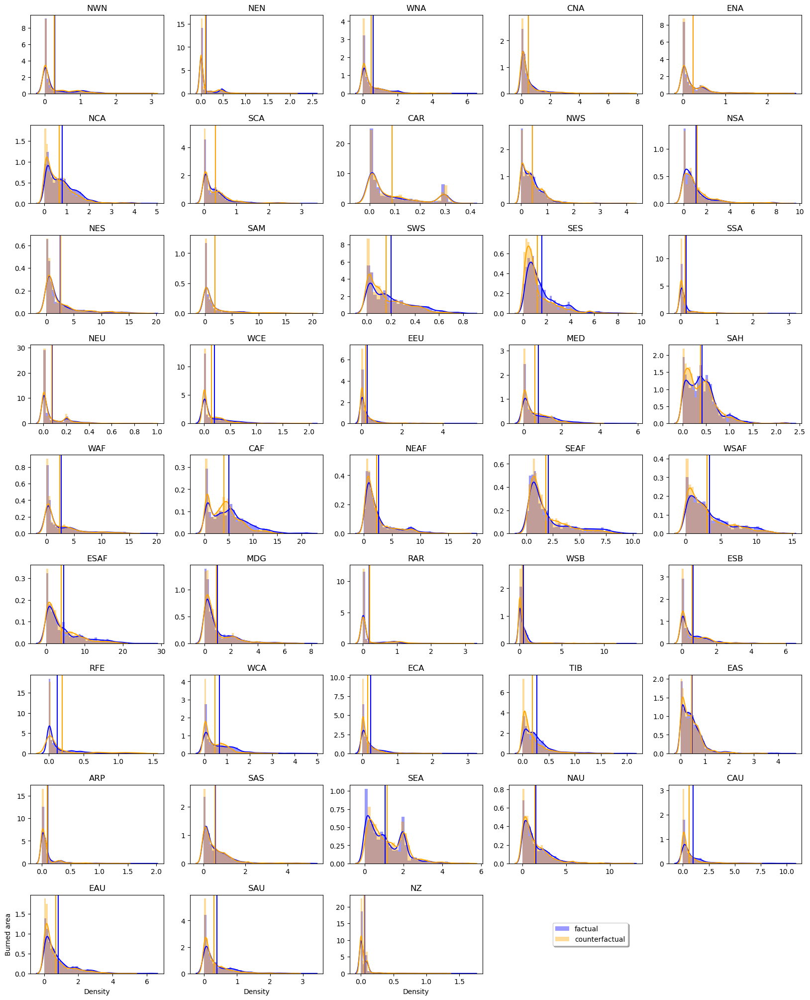

In [40]:
### By region
# Attribution PDF regionally
regionlist = []
RiskList = []
StatList = []

 
def draw_bs_replicates(data,size):
    """creates a bootstrap sample, computes replicates and returns replicates array"""
    # Create an empty array to store replicates
    bs_replicates = np.empty(size)
    bs_sample = np.random.choice(data,size=size)
    return bs_sample 

fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()

#Regional weighting
for idx, regionname in enumerate(obsclim_0219.columns.unique(level='Region')):
    ObsclimArray = []
    CounterclimArray = []
    for model_name in obsclim_0219[regionname].columns:
        ObsclimArray.append(draw_bs_replicates(obsclim_0219[regionname][model_name], size=1000))
        CounterclimArray.append(draw_bs_replicates(counterclim_0219[regionname][model_name], size=1000))
        
    Obsclim = []
    for n in np.arange(0,7):
        for i in ObsclimArray[n]:
            Obsclim.append(i)

    Counterclim = []
    for n in np.arange(0,7):
        for i in CounterclimArray[n]:
            Counterclim.append(i)
       
        
    ax = axs[idx]
    sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' ) 
    sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
    ax.axvline(x=np.nanmean(Obsclim), color='blue')
    ax.axvline(x=np.nanmean(Counterclim), color='orange')
    ax.set_title(regionname) 
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')

    ALL = (np.count_nonzero(Obsclim > (np.nanmean(Counterclim))))
    NAT = (np.count_nonzero(Counterclim > (np.nanmean(Counterclim))))
    RR = ALL/NAT
    testc=(Obsclim)
    testd=(Counterclim)

    stat = stats.kstest(testc, testd)
    regionlist.append(regionname)
    RiskList.append(RR)
    StatList.append(stat)
    
df1 = pd.DataFrame(StatList)
df = pd.DataFrame(RiskList,regionlist)
print(df1)
print(df)

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)

for ax in axs[40:44]:
    ax.set_xlabel('Density')
ax = axs[40]
ax.set_ylabel('Burned area')
plt.subplots_adjust(hspace=0.4)  

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Weighting/AR6regions_notweighted.png',facecolor='w', transparent=False)    
plt.show()

# Bootstrapping with weighting for each region

/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

NWN 1.3548387096774193 KstestResult(statistic=0.17894736842105263, pvalue=0.09543794481613224, statistic_location=-0.7260231, statistic_sign=-1)
NEN 1.0625 KstestResult(statistic=0.13541666666666666, pvalue=0.34359375969646605, statistic_location=-0.9999076, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

WNA 1.2758620689655173 KstestResult(statistic=0.15463917525773196, pvalue=0.19699643673043452, statistic_location=-0.4009133, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:44: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label=

CNA 1.2903225806451613 KstestResult(statistic=0.16666666666666666, pvalue=0.13914239722589974, statistic_location=-0.26923493, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

ENA 0.8048780487804879 KstestResult(statistic=0.1134020618556701, pvalue=0.5632950213999474, statistic_location=-0.10463669, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

NCA 1.3333333333333333 KstestResult(statistic=0.16494845360824742, pvalue=0.14303028232674675, statistic_location=0.682482, statistic_sign=-1)
SCA 0.8823529411764706 KstestResult(statistic=0.09278350515463918, pvalue=0.8007074861923217, statistic_location=-0.37886345, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

CAR 0.8387096774193549 KstestResult(statistic=0.15625, pvalue=0.19229768972847908, statistic_location=-0.8824438, statistic_sign=1)
NWS 1.2777777777777777 KstestResult(statistic=0.15625, pvalue=0.19229768972847908, statistic_location=0.21867542, statistic_sign=-1)
NSA 0.8048780487804879 KstestResult(statistic=0.15625, pvalue=0.19229768972847908, statistic_location=-0.5096229, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

NES 0.8536585365853658 KstestResult(statistic=0.08333333333333333, pvalue=0.8951876639274218, statistic_location=0.52876925, statistic_sign=1)
SAM 0.9473684210526315 KstestResult(statistic=0.07291666666666667, pvalue=0.9620747159940212, statistic_location=-0.2862847, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

SWS 1.564102564102564 KstestResult(statistic=0.2916666666666667, pvalue=0.0005265596135806317, statistic_location=0.03980433, statistic_sign=-1)
SES 2.032258064516129 KstestResult(statistic=0.3541666666666667, pvalue=9.664552863687627e-06, statistic_location=0.27603933, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

SSA 0.9210526315789473 KstestResult(statistic=0.15625, pvalue=0.19229768972847908, statistic_location=1.1682016, statistic_sign=-1)
NEU 1.6666666666666667 KstestResult(statistic=0.17708333333333334, pvalue=0.0985266853657828, statistic_location=-1.0, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

WCE 1.0857142857142856 KstestResult(statistic=0.14432989690721648, pvalue=0.2654793849715836, statistic_location=0.32577264, statistic_sign=-1)
EEU 1.0416666666666667 KstestResult(statistic=0.09183673469387756, pvalue=0.8057256953635169, statistic_location=-0.99648607, statistic_sign=-1)
MED 1.2666666666666666 KstestResult(statistic=0.09278350515463918, pvalue=0.8007074861923217, statistic_location=0.014717818, statistic_sign=-1)
SAH 1.2682926829268293 KstestResult(statistic=0.14432989690721648, pvalue=0.2654793849715836, statistic_location=0.3334773, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

WAF 1.0 KstestResult(statistic=0.1134020618556701, pvalue=0.5632950213999474, statistic_location=-0.40514675, statistic_sign=1)
CAF 1.1162790697674418 KstestResult(statistic=0.16666666666666666, pvalue=0.13914239722589974, statistic_location=0.17444982, statistic_sign=-1)
NEAF 1.5161290322580645 KstestResult(statistic=0.16666666666666666, pvalue=0.13914239722589974, statistic_location=0.027000336, statistic_sign=-1)
SEAF 1.457142857142857 KstestResult(statistic=0.21649484536082475, pvalue=0.0209519039352964, statistic_location=-0.01713564, statistic_sign=-1)
WSAF 0.8260869565217391 KstestResult(statistic=0.14432989690721648, pvalue=0.2654793849715836, statistic_location=-0.22660162, statistic_sign=1)
ESAF 1.170731707317073 KstestResult(statistic=0.10416666666666667, pvalue=0.6776467663158616, statistic_location=0.14825854, statistic_sign=-1)
MDG 0.9130434782608695 KstestResult(statistic=0.07216494845360824, pvalue=0.963765833846802, statistic_location=0.37901542, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

RAR 0.7916666666666666 KstestResult(statistic=0.125, pvalue=0.443211752998283, statistic_location=-0.94428205, statistic_sign=-1)
WSB 1.2142857142857142 KstestResult(statistic=0.19791666666666666, pvalue=0.04631391943732743, statistic_location=0.39096478, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

ESB 0.868421052631579 KstestResult(statistic=0.12371134020618557, pvalue=0.4498621343358823, statistic_location=-0.6501733, statistic_sign=-1)
RFE 0.7777777777777778 KstestResult(statistic=0.2268041237113402, pvalue=0.01338105529175212, statistic_location=-0.34431663, statistic_sign=1)


/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

WCA 1.1 KstestResult(statistic=0.14583333333333334, pvalue=0.2599850473768807, statistic_location=1.844459, statistic_sign=-1)
ECA 1.5789473684210527 KstestResult(statistic=0.24742268041237114, pvalue=0.005114660397934785, statistic_location=0.05370028, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:45: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https:

TIB 1.4736842105263157 KstestResult(statistic=0.24742268041237114, pvalue=0.005114660397934785, statistic_location=0.5550881, statistic_sign=-1)
EAS 1.075 KstestResult(statistic=0.13402061855670103, pvalue=0.3497798382521135, statistic_location=-0.23756954, statistic_sign=-1)


/var/tmp/ipykernel_51520/1270483137.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
/var/tmp/ipykernel_51520/1270483137.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curren

OverflowError: cannot convert float infinity to integer

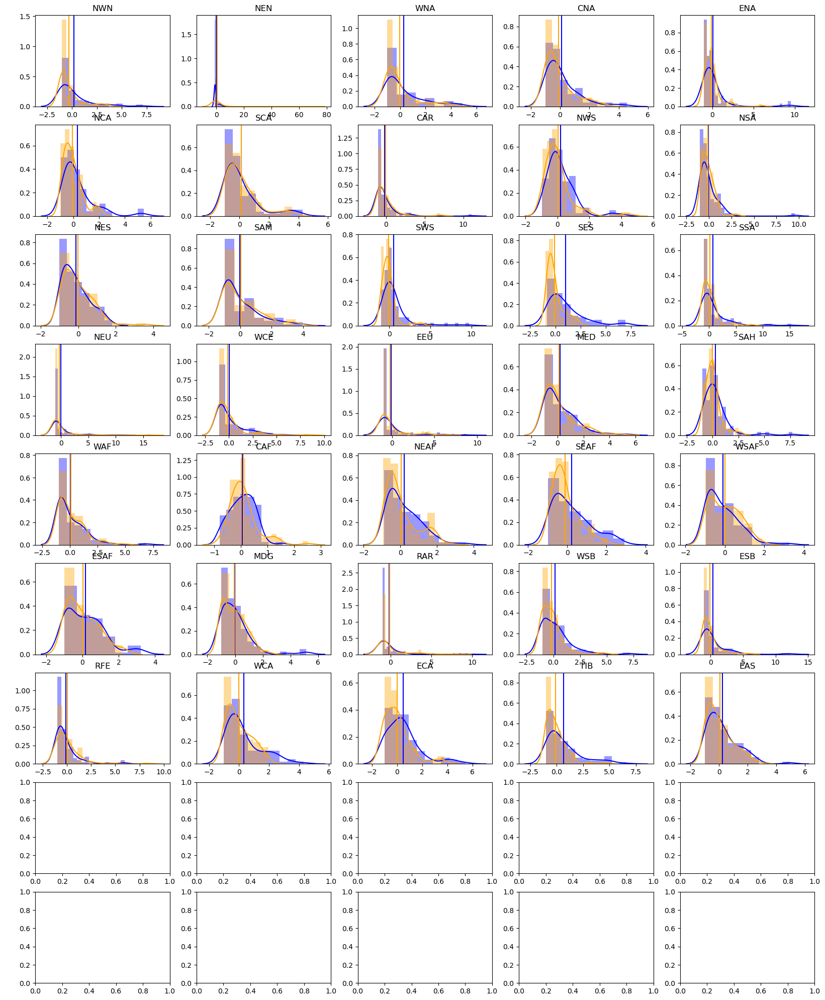

In [250]:
#obsclim_0319_Nanom = (obsclim_0319-counterclim_0319.mean())/counterclim_0319.mean()
#counterclim_0319_Nanom = (counterclim_0319-counterclim_0319.mean())/counterclim_0319.mean()


### By region
# Attribution PDF regionally
regionlist = []
RiskList = []
StatList = []

 
def draw_bs_replicates(data,size):
    """creates a bootstrap sample, computes replicates and returns replicates array"""
    # Create an empty array to store replicates
    bs_replicates = np.empty(size)
    bs_replicates = np.random.choice(data,size=size)
    return bs_replicates 

fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()

#Regional weighting
for idx, regionname in enumerate(obsclim_0319.columns.unique(level='Region')):
    ObsclimArray = []
    CounterclimArray = []
    for model_name in obsclim_0319[regionname].columns:
        obsclim_0319_Nanom = (obsclim_0319[regionname][model_name]-counterclim_0319[regionname][model_name].mean())/counterclim_0319[regionname][model_name].mean()
        ObsclimArray.append(draw_bs_replicates(obsclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
        counterclim_0319_Nanom = (counterclim_0319[regionname][model_name]-counterclim_0319[regionname][model_name].mean())/counterclim_0319[regionname][model_name].mean()
        CounterclimArray.append(draw_bs_replicates(counterclim_0319_Nanom, size=np.int(100*Weights[regionname][model_name][0])))
        
    Obsclim = []
    for n in np.arange(0,7):
        for i in ObsclimArray[n]:
            Obsclim.append(i)                             

    Counterclim = []
    for n in np.arange(0,7):
        for i in CounterclimArray[n]:
            Counterclim.append(i)
       
    
    ax = axs[idx]
    sns.distplot(Obsclim, hist=True, kde=True, ax=ax,  label='factual', color='blue' ) 
    sns.distplot(Counterclim, hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
    ax.axvline(x=np.nanmean(Obsclim), color='blue')
    ax.axvline(x=np.nanmean(Counterclim), color='orange')
    ax.set_title(regionname) 
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')

    ALL = (np.count_nonzero(Obsclim > (np.nanmean(Counterclim))))
    NAT = (np.count_nonzero(Counterclim > (np.nanmean(Counterclim))))
    RR = ALL/NAT
    testc=(Obsclim)
    testd=(Counterclim)

    stat = stats.kstest(testc, testd)
    regionlist.append(regionname)
    RiskList.append(RR)
    StatList.append(stat)
    print(regionname, RR, stat)
    
df1 = pd.DataFrame(StatList)
df = pd.DataFrame(RiskList,regionlist)
print(df1)
print(df)

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)

for ax in axs[40:44]:
    ax.set_xlabel('Density')
ax = axs[40]
ax.set_ylabel('Burned area')
plt.subplots_adjust(hspace=0.4)  

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/AR6regions_weighted_Nanom.png',facecolor='w', transparent=False)    
plt.show()

# Four PDFs for Attribution - unweighted

/var/tmp/ipykernel_61892/1512534270.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_global_PI_noVISIT, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
/var/tmp/ipykernel_61892/1512534270.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterc

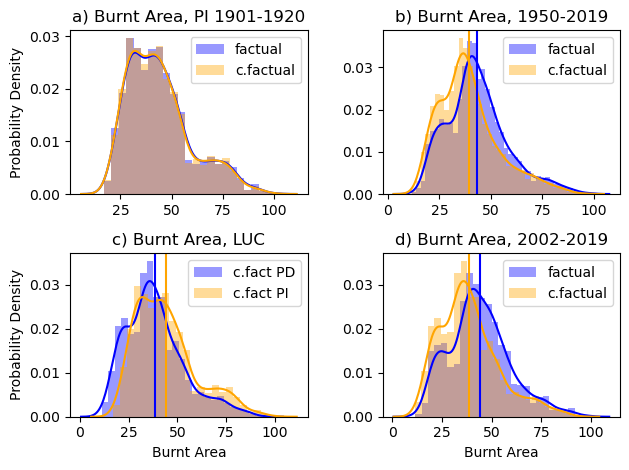

In [69]:

plt.subplot(2,2,1)
sns.distplot(obsclim_global_PI_noVISIT, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_PI_noVISIT, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.legend(loc='best')
plt.title('a) Burnt Area, PI 1901-1920')
plt.ylabel('Probability Density')

plt.subplot(2,2,2)
sns.distplot(obsclim_global_1950_noVISIT, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_1950_noVISIT, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_global_1950_noVISIT) , color='blue')
plt.axvline(x=np.nanmean(counterclim_global_1950_noVISIT), color='orange')
plt.ylabel(' ')
plt.legend(loc='best')
plt.title('b) Burnt Area, 1950-2019')

plt.subplot(2,2,3)
sns.distplot(counterclim_0219_glob_noVISIT, kde=True, color="blue",label='c.fact PD',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_PI_noVISIT, kde=True, color="orange",label='c.fact PI',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(counterclim_0219_glob_noVISIT) , color='blue')
plt.axvline(x=np.nanmean(counterclim_global_PI_noVISIT), color='orange')
plt.legend(loc='best')
plt.title('c) Burnt Area, LUC')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')

plt.subplot(2,2,4)
sns.distplot(obsclim_0219_glob_noVISIT, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_0219_glob_noVISIT, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_0219_glob_noVISIT) , color='blue')
plt.axvline(x=np.nanmean(counterclim_0219_glob_noVISIT), color='orange')
plt.title('d) Burnt Area, 2002-2019')
plt.ylabel(' ')
plt.xlabel('Burnt Area')
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/4pdfs.png',facecolor='w', transparent=False)    
plt.show()


# Four PDFs for Attribution - unweighted, relative anomaly (from Nikos)

/var/tmp/ipykernel_51520/1350541025.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((obsclim_global_PI_noVISIT - counterclim_global_PI_noVISIT.mean())/counterclim_global_PI_noVISIT.mean()) , kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
/var/tmp/ipykernel_51520/1350541025.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://

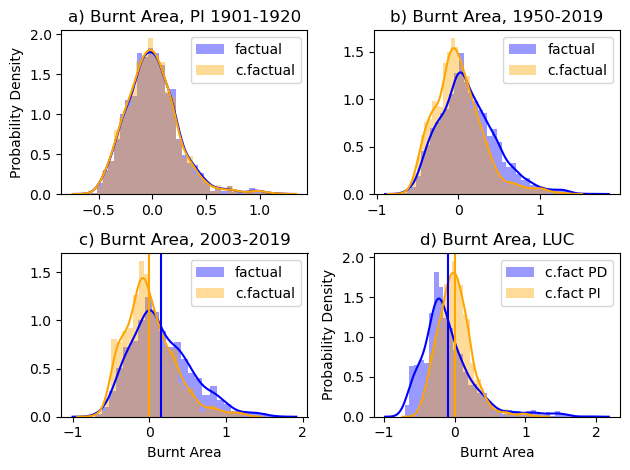

In [222]:

obsclim_global_PI_noVISIT_Nanom = (obsclim_global_PI_noVISIT - counterclim_global_PI_noVISIT.mean())/counterclim_global_PI_noVISIT.mean()
counterclim_global_PI_noVISIT_Nanom = (counterclim_global_PI_noVISIT-counterclim_global_PI_noVISIT.mean())/counterclim_global_PI_noVISIT.mean()

plt.subplot(2,2,1)
sns.distplot(obsclim_global_PI_noVISIT_Nanom , kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_PI_noVISIT_Nanom, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.legend(loc='best')
plt.title('a) Burnt Area, PI 1901-1920')
plt.ylabel('Probability Density')



obsclim_1950_glob_noVISIT_Nanom = (obsclim_global_1950_noVISIT-counterclim_global_1950_noVISIT.mean())/counterclim_global_1950_noVISIT.mean()
counterclim_1950_glob_noVISIT_Nanom = (counterclim_global_1950_noVISIT-counterclim_global_1950_noVISIT.mean())/counterclim_global_1950_noVISIT.mean()

plt.subplot(2,2,2)
sns.distplot(obsclim_1950_glob_noVISIT_Nanom , kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_1950_glob_noVISIT_Nanom, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
#plt.axvline(x=np.nanmean(obsclim_global_1950_noVISIT) , color='blue')
#plt.axvline(x=np.nanmean(counterclim_global_1950_noVISIT), color='orange')
plt.ylabel(' ')
plt.legend(loc='best')
plt.title('b) Burnt Area, 1950-2019')


obsclim_0319_glob_noVISIT_Nanom = (obsclim_0319_glob_noVISIT-counterclim_0319_glob_noVISIT.mean())/counterclim_0319_glob_noVISIT.mean()
counterclim_0319_glob_noVISIT_Nanom = (counterclim_0319_glob_noVISIT-counterclim_0319_glob_noVISIT.mean())/counterclim_0319_glob_noVISIT.mean()

plt.subplot(2,2,3)
sns.distplot(obsclim_0319_glob_noVISIT_Nanom, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_0319_glob_noVISIT_Nanom, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(obsclim_0319_glob_noVISIT_Nanom) , color='blue')
plt.axvline(x=np.nanmean(counterclim_0319_glob_noVISIT_Nanom), color='orange')
plt.title('c) Burnt Area, 2003-2019')
plt.ylabel(' ')
plt.xlabel('Burnt Area')
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/4pdfs_Abs.png',facecolor='w', transparent=False)    


counterclim_LUC_glob_noVISIT_Nanom = (counterclim_0319_glob_noVISIT-counterclim_global_PI_noVISIT.mean())/counterclim_global_PI_noVISIT.mean()

plt.subplot(2,2,4)
sns.distplot(counterclim_LUC_glob_noVISIT_Nanom, kde=True, color="blue",label='c.fact PD',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(counterclim_global_PI_noVISIT_Nanom, kde=True, color="orange",label='c.fact PI',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.axvline(x=np.nanmean(counterclim_LUC_glob_noVISIT_Nanom) , color='blue')
plt.axvline(x=np.nanmean(counterclim_global_PI_noVISIT_Nanom), color='orange')
plt.legend(loc='best')
plt.title('d) Burnt Area, LUC')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')
plt.show()


# Four PDFs for Attribution - weighted, relative anomaly from Nikos

/var/tmp/ipykernel_51520/2514029380.py:21: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimPIArray.append(draw_bs_replicates(obsclim_global_PI_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))
/var/tmp/ipykernel_51520/2514029380.py:22: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to revi

0.9542048293089093
KstestResult(statistic=0.0247074122236671, pvalue=0.004472090087021944, statistic_location=0.036895752, statistic_sign=1)


/var/tmp/ipykernel_51520/2514029380.py:55: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  Obsclim1950Array.append(draw_bs_replicates(obsclim_1950_glob_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))
/var/tmp/ipykernel_51520/2514029380.py:56: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to re

1.1082427536231885
KstestResult(statistic=0.05881764529358808, pvalue=1.8755690410271675e-15, statistic_location=-0.009688626, statistic_sign=-1)


/var/tmp/ipykernel_51520/2514029380.py:90: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ObsclimArray.append(draw_bs_replicates(obsclim_0319_glob_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))
/var/tmp/ipykernel_51520/2514029380.py:91: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

1.1730769230769231
KstestResult(statistic=0.09842952885865759, pvalue=1.4842789406790358e-42, statistic_location=0.080935694, statistic_sign=-1)


/var/tmp/ipykernel_51520/2514029380.py:112: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Counterclim, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
/var/tmp/ipykernel_51520/2514029380.py:127: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more detai

0.694006309148265
KstestResult(statistic=0.29378813644093227, pvalue=1e-323, statistic_location=-0.10820122, statistic_sign=1)


/var/tmp/ipykernel_51520/2514029380.py:148: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ObsclimLUC, kde=True, color="blue",label='c.fact PD',fit_kws={"linewidth":2.5,"color":"darkblue"})
/var/tmp/ipykernel_51520/2514029380.py:149: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(CounterclimLUC, k

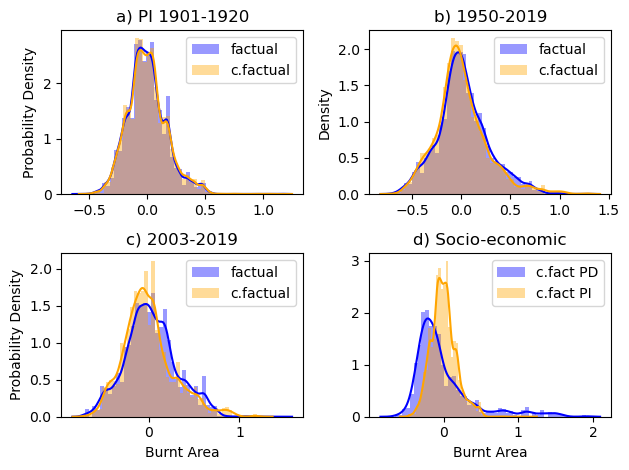

In [230]:
def draw_bs_replicates(data,size):
    """creates a bootstrap sample, computes replicates and returns replicates array"""
    # Create an empty array to store replicates
    bs_replicates = np.empty(size)
    bs_sample = np.random.choice(data,size=size)
    return bs_sample

obsclim_global_PI_Nanom = (obsclim_global_PI - counterclim_global_PI.mean())/counterclim_global_PI.mean()
counterclim_global_PI_Nanom = (counterclim_global_PI-counterclim_global_PI.mean())/counterclim_global_PI.mean()
obsclim_1950_glob_Nanom = (obsclim_global_1950-counterclim_global_1950.mean())/counterclim_global_1950.mean()
counterclim_1950_glob_Nanom = (counterclim_global_1950-counterclim_global_1950.mean())/counterclim_global_1950.mean()
obsclim_0319_glob_Nanom = (obsclim_0319_glob-counterclim_0319_glob.mean())/counterclim_0319_glob.mean()
counterclim_0319_glob_Nanom = (counterclim_0319_glob-counterclim_0319_glob.mean())/counterclim_0319_glob.mean()
counterclim_LUC_glob_Nanom = (counterclim_0319_glob-counterclim_global_PI.mean())/counterclim_global_PI.mean()

#PI
ObsclimPIArray = []
CounterclimPIArray = []

for model_name in obsclim_global_PI_Nanom: 
    ObsclimPIArray.append(draw_bs_replicates(obsclim_global_PI_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))   
    CounterclimPIArray.append(draw_bs_replicates(counterclim_global_PI_Nanom[model_name],  np.int(10000*Weights['Global'][model_name][0])))

ObsclimPI = []
for n in np.arange(0,7):
    for i in ObsclimPIArray[n]:
        ObsclimPI.append(i)

CounterclimPI = []
for n in np.arange(0,7):
    for i in CounterclimPIArray[n]:
        CounterclimPI.append(i)
        
ALL = (np.count_nonzero(ObsclimPI > (np.nanmean(CounterclimPI))))
NAT = (np.count_nonzero(CounterclimPI > (np.nanmean(CounterclimPI))))
RR = ALL/NAT
stat = stats.kstest(ObsclimPI, CounterclimPI)
print(RR)
print(stat)
        
plt.subplot(2,2,1)
sns.distplot(ObsclimPI, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(CounterclimPI, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
plt.legend(loc='best')
plt.title('a) PI 1901-1920')
plt.ylabel('Probability Density')



#1950
Obsclim1950Array = []
Counterclim1950Array = []

for model_name in obsclim_1950_glob_Nanom: 
    Obsclim1950Array.append(draw_bs_replicates(obsclim_1950_glob_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))   
    Counterclim1950Array.append(draw_bs_replicates(counterclim_1950_glob_Nanom[model_name],  np.int(10000*Weights['Global'][model_name][0])))

Obsclim1950 = []
for n in np.arange(0,7):
    for i in Obsclim1950Array[n]:
        Obsclim1950.append(i)

Counterclim1950 = []
for n in np.arange(0,7):
    for i in Counterclim1950Array[n]:
        Counterclim1950.append(i)

ALL = (np.count_nonzero(Obsclim1950 > (np.nanmean(Counterclim1950))))
NAT = (np.count_nonzero(Counterclim1950 > (np.nanmean(Counterclim1950))))
RR = ALL/NAT
stat = stats.kstest(Obsclim1950, Counterclim1950)
print(RR)
print(stat)

plt.subplot(2,2,2)
sns.distplot(Obsclim1950, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(Counterclim1950, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
#plt.axvline(x=np.nanmean(Obsclim1950) , color='blue')
#plt.axvline(x=np.nanmean(Counterclim1950), color='orange')
plt.title('b) 1950-2019')
plt.legend(loc='best')



#2003-2019
ObsclimArray = []
CounterclimArray = []

for model_name in obsclim_0319_glob_Nanom: 
    ObsclimArray.append(draw_bs_replicates(obsclim_0319_glob_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))   
    CounterclimArray.append(draw_bs_replicates(counterclim_0319_glob_Nanom[model_name],  np.int(10000*Weights['Global'][model_name][0])))

Obsclim = []
for n in np.arange(0,7):
    for i in ObsclimArray[n]:
        Obsclim.append(i)

Counterclim = []
for n in np.arange(0,7):
    for i in CounterclimArray[n]:
        Counterclim.append(i)

ALL = (np.count_nonzero(Obsclim > (np.nanmean(Counterclim))))
NAT = (np.count_nonzero(Counterclim > (np.nanmean(Counterclim))))
RR = ALL/NAT
stat = stats.kstest(Obsclim, Counterclim)
print(RR)
print(stat)

plt.subplot(2,2,3)
sns.distplot(Obsclim, kde=True, color="blue",label='factual',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(Counterclim, kde=True, color="orange",label='c.factual',fit_kws={"linewidth":2.5,"color":"darkorange"})
#plt.axvline(x=np.nanmean(Obsclim) , color='blue')
#plt.axvline(x=np.nanmean(Counterclim), color='orange')
plt.title('c) 2003-2019')
plt.legend(loc='best')
plt.xlabel('Burnt Area')
plt.ylabel('Probability Density')



#LUC
ObsclimLUCArray = []
CounterclimLUCArray = []

for model_name in counterclim_LUC_glob_Nanom: 
    ObsclimLUCArray.append(draw_bs_replicates(counterclim_LUC_glob_Nanom[model_name], np.int(10000*Weights['Global'][model_name][0])))   
    CounterclimLUCArray.append(draw_bs_replicates(counterclim_global_PI_Nanom[model_name],  np.int(10000*Weights['Global'][model_name][0])))

ObsclimLUC = []
for n in np.arange(0,7):
    for i in ObsclimLUCArray[n]:
        ObsclimLUC.append(i)

CounterclimLUC = []
for n in np.arange(0,7):
    for i in CounterclimLUCArray[n]:
        CounterclimLUC.append(i)

ALL = (np.count_nonzero(ObsclimLUC > (np.nanmean(CounterclimLUC))))
NAT = (np.count_nonzero(CounterclimLUC > (np.nanmean(CounterclimLUC))))
RR = ALL/NAT
stat = stats.kstest(ObsclimLUC, CounterclimLUC)
print(RR)
print(stat)

plt.subplot(2,2,4)
sns.distplot(ObsclimLUC, kde=True, color="blue",label='c.fact PD',fit_kws={"linewidth":2.5,"color":"darkblue"})
sns.distplot(CounterclimLUC, kde=True, color="orange",label='c.fact PI',fit_kws={"linewidth":2.5,"color":"darkorange"})
#plt.axvline(x=np.nanmean(ObsclimLUC) , color='blue')
#plt.axvline(x=np.nanmean(CounterclimLUC), color='orange')
plt.legend(loc='best')
plt.title('d) Socio-economic')
plt.ylabel(' ')
plt.xlabel('Burnt Area')
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/4pdfs_weighted.png',facecolor='w', transparent=False)    
plt.show()

# Attribution PDF by region (monthly, 2002-2019)

/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counter

/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.dis

/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counter

/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.dis

/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='factual', color='blue' )
/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counter

/var/tmp/ipykernel_51520/2771272783.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
/var/tmp/ipykernel_51520/2771272783.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.dis

    statistic        pvalue
0    0.048942  5.346045e-02
1    0.045635  8.579522e-02
2    0.073413  5.754856e-04
3    0.065476  3.053437e-03
4    0.023148  8.128154e-01
5    0.113095  7.706957e-09
6    0.046958  7.128887e-02
7    0.027116  6.347839e-01
8    0.042989  1.222939e-01
9    0.070106  1.180631e-03
10   0.041005  1.573102e-01
11   0.046296  7.825843e-02
12   0.123677  1.715550e-10
13   0.181217  4.211721e-22
14   0.141534  1.279625e-13
15   0.040344  1.706224e-01
16   0.099206  6.758011e-07
17   0.060847  7.399509e-03
18   0.097884  1.003481e-06
19   0.076058  3.162118e-04
20   0.037037  2.509023e-01
21   0.154762  3.275189e-16
22   0.046958  7.128887e-02
23   0.058862  1.059997e-02
24   0.080026  1.237553e-04
25   0.067460  2.048282e-03
26   0.045635  8.579522e-02
27   0.036376  2.698851e-01
28   0.130291  1.336021e-11
29   0.074074  4.964626e-04
30   0.120370  5.845515e-10
31   0.144180  4.050374e-14
32   0.099868  5.534823e-07
33   0.206349  1.407021e-28
34   0.037698  2.329

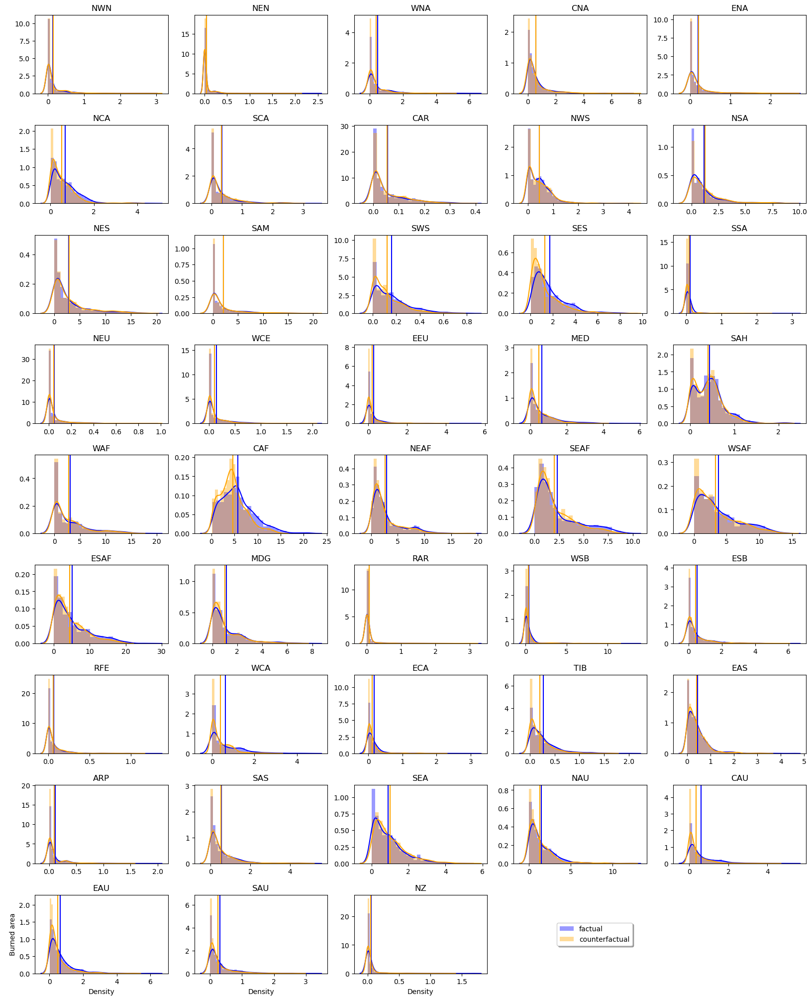

/var/tmp/ipykernel_51520/2771272783.py:56: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, label='factual', color='blue' )
/var/tmp/ipykernel_51520/2771272783.py:57: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(counterclim_021

NameError: name 'obsclim_short' is not defined

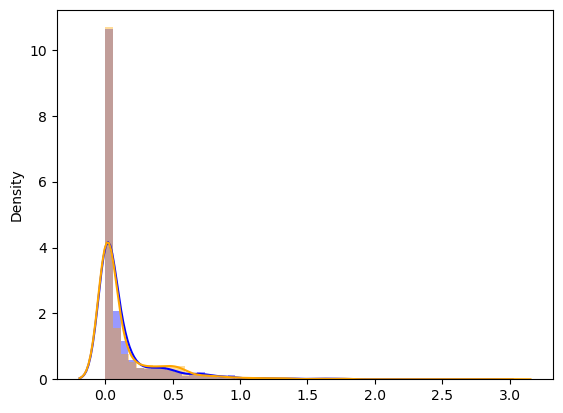

In [255]:
# Attribution PDF regionally
regionlist = []
RiskList = []
StatList = []

fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()
for idx, regionname in enumerate(obsclim_0219.columns.unique(level='Region')):
        ax = axs[idx]
        #print(obsclim_short[regionname].drop(['VISIT'], axis=1))

        sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='factual', color='blue' ) 
        sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='counterfactual',  color='orange')
        ax.axvline(x=np.nanmean(obsclim_0219[regionname].drop(['VISIT'], axis=1)) , color='blue')
        ax.axvline(x=np.nanmean(counterclim_0219[regionname].drop(['VISIT'], axis=1)), color='orange')
        ax.set_title(regionname) 
        ax.set_xlabel(' ')
        ax.set_ylabel(' ')

        ALL = (np.count_nonzero(obsclim_0219[regionname].drop(['VISIT'], axis=1) > (np.nanmean(counterclim_0219[regionname].drop(['VISIT'], axis=1)))))
        NAT = (np.count_nonzero(counterclim_0219[regionname].drop(['VISIT'], axis=1) > (np.nanmean(counterclim_0219[regionname].drop(['VISIT'], axis=1)))))
        RR = ALL/NAT
        testc=(obsclim_0219[regionname].to_numpy())
        testd=(counterclim_0219[regionname].to_numpy())

        stat = stats.kstest(testc.ravel(), testd.ravel())
        regionlist.append(regionname)
        RiskList.append(np.round(RR,2))
        StatList.append(stat)
df1 = pd.DataFrame(StatList)
df = pd.DataFrame(RiskList,regionlist)
print(df1)
print(df)

df.to_csv('/scratch/cburton/scratch/ISIMIP3a/RiskRatio.csv') 

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)

for ax in axs[40:44]:
    ax.set_xlabel('Density')
ax = axs[40]
ax.set_ylabel('Burned area')
plt.subplots_adjust(hspace=0.4)  

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/AR6regions.png',facecolor='w', transparent=False)    
plt.show()


##Save each region individually:
for idx, regionname in enumerate(obsclim_0219.columns.unique(level='Region')):
    sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, label='factual', color='blue' ) 
    sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True,  label='c.factual',  color='orange')
    plt.axvline(x=np.nanmean(obsclim_short[regionname].drop(['VISIT'], axis=1)) , color='blue')
    plt.axvline(x=np.nanmean(counterclim_short[regionname].drop(['VISIT'], axis=1)), color='orange')
    plt.title(regionname)
    plt.legend()   
    plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/Regions/'+regionname+'.png',facecolor='w', transparent=False)
    plt.close()
print('done')


# PDF Attribution - Selected Regions

/var/tmp/ipykernel_61892/1155472036.py:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='HIST', color='blue' )
/var/tmp/ipykernel_61892/1155472036.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(countercli

/var/tmp/ipykernel_61892/1155472036.py:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='HIST', color='blue' )
/var/tmp/ipykernel_61892/1155472036.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(countercli

NameError: name 'counterclim_global' is not defined

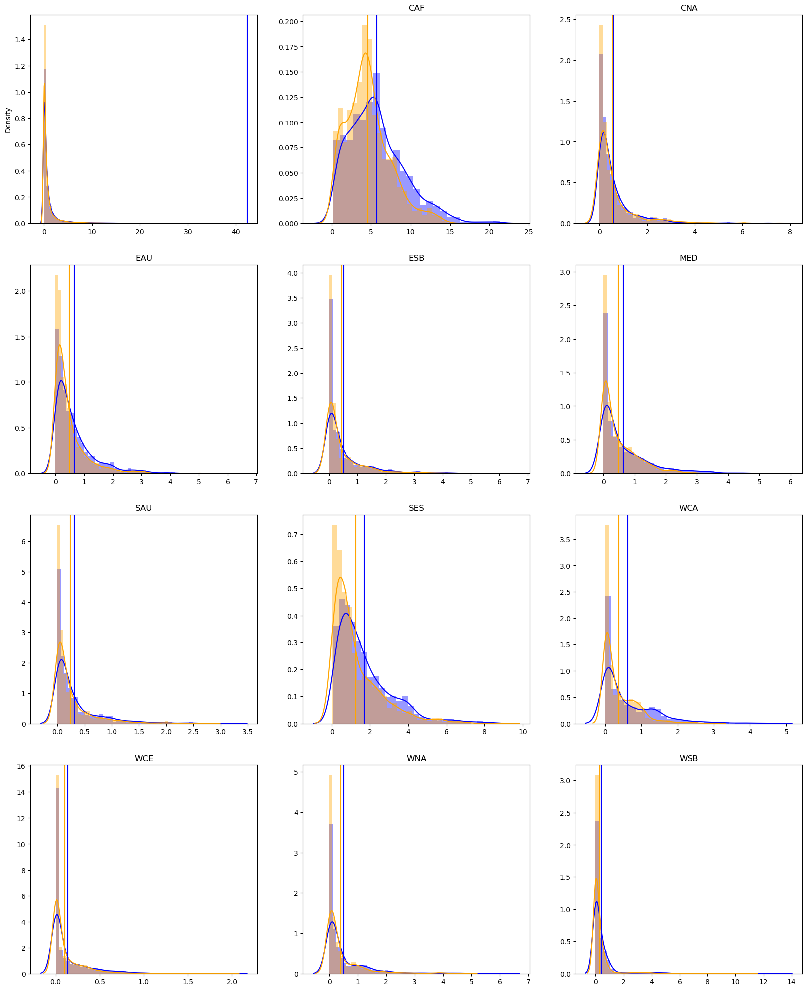

In [73]:
#Plot burnt area PDF monthly by region

fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
SelectedRegions = ['CAF', 'CNA', 'EAU', 'ESB', 'MED', 'SAU', 'SES', 'WCA', 'WCE', 'WNA', 'WSB']


for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    sns.distplot(obsclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='HIST', color='blue' ) 
    sns.distplot(counterclim_0219[regionname].drop(['VISIT'], axis=1), hist=True, kde=True, ax=ax,  label='CF',  color='orange')
    ax.axvline(x=np.nanmean(obsclim_0219[regionname].drop(['VISIT'], axis=1)) , color='blue')
    ax.axvline(x=np.nanmean(counterclim_0219[regionname].drop(['VISIT'], axis=1)), color='orange')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ') 

    
    
ax = axs[0]
sns.distplot(obsclim_0219, hist=True, kde=True, ax=ax,  label='factual', color='blue') 
sns.distplot(counterclim_0219, hist=True, kde=True, ax=ax,  label='counterfactual', color='orange')
ax.axvline(x=np.nanmean(obsclim_global), color='blue')
ax.axvline(x=np.nanmean(counterclim_global), color='orange')
ax.legend() 
ax.set_xlabel(' ')
ax.set_ylabel(' ') 
ax.set_title('Global')

for ax in axs[9:12]:
    ax.set_xlabel('Burnt Area') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('Density') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PDF_Attribution/AR6regions_Selected.png',facecolor='w', transparent=False)    
plt.show()

# QQ Plots for all regions

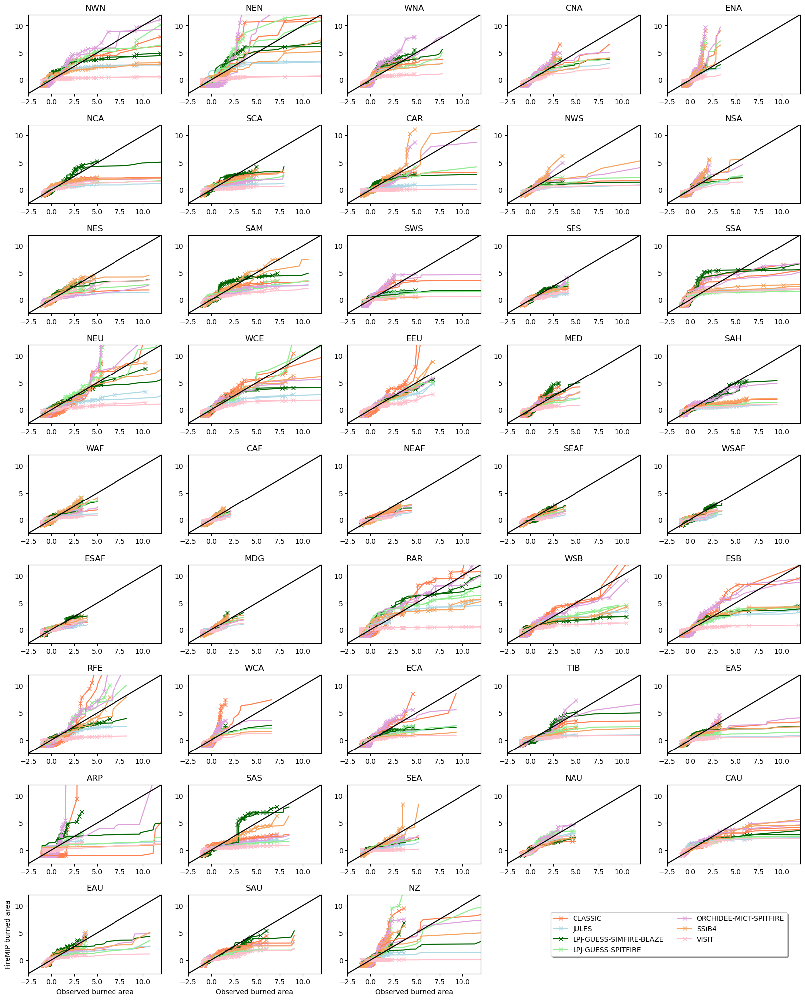

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

done


In [112]:


model_colours = {'JULES': 'lightblue', 
              'CLASSIC': 'coral', 
              'SSiB4': 'sandybrown',
              'LPJ-GUESS-SPITFIRE': 'lightgreen',
            'LPJ-GUESS-SIMFIRE-BLAZE': 'darkgreen',
            'ORCHIDEE-MICT-SPITFIRE':'plum',
             'VISIT':'pink'}

fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()
for idx, regionname in enumerate(obsclim_0319_Ranom.columns.unique(level='Region')):
    ax = axs[idx]
    for model_name in obsclim_0319_Ranom[regionname].columns:
        ax.plot(np.sort(obs_0319_Ranom[regionname]['GFED5']), np.sort(obsclim_0319_Ranom[regionname][model_name]), marker='x', color=model_colours[model_name], label=model_name)
    #ax.plot(np.sort(obs_0319_Ranom[regionname]['GFED5']), np.sort(obsclim_0319_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), marker='x', color='grey', label='GFED')
    for model_name in obsclim_0319_Ranom[regionname].columns:
        ax.plot(np.sort(obs_0319_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_0319_Ranom[regionname][model_name]), color=model_colours[model_name])
    #ax.plot(np.sort(obs_0319_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_0319_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), color='grey', label='CCI')

    axis_min=-2.5
    axix_max=12.0
    ax.set_xlabel('  ')
    ax.set_ylabel(' ')
    ax.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
    ax.set_ylim(axis_min,axix_max)
    ax.set_xlim(axis_min,axix_max)    
    ax.set_title(regionname)
    
plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=2)

for ax in axs[40:44]:
    ax.set_xlabel('Observed burned area')
ax = axs[40]
ax.set_ylabel('FireMIP burned area')
plt.subplots_adjust(hspace=0.4)  
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/QQ_R6regions_Ranom.png',facecolor='w', transparent=False)
plt.show()


##Save each region individually:
for idx, regionname in enumerate(obsclim_0319_Ranom.columns.unique(level='Region')):
    for model_name in obsclim_0319_Ranom[regionname].columns:
        ax.plot(np.sort(obs_0319_Ranom[regionname]['GFED5']), np.sort(obsclim_0319_Ranom[regionname][model_name]), marker='x', color=model_colours[model_name], label=model_name)
    #ax.plot(np.sort(obs_0319_Ranom[regionname]['GFED5']), np.sort(obsclim_0319_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), marker='x', color='plum', label='GFED')
    for model_name in obsclim_0319_Ranom[regionname].columns:
        ax.plot(np.sort(obs_0319_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_0319_Ranom[regionname][model_name]), color=model_colours[model_name])
    #ax.plot(np.sort(obs_0319_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_0319_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), color='plum', label='CCI')

    axis_min=-2.5
    axix_max=12.0
    plt.xlabel('Observed burned area')
    plt.ylabel('FireMIP burned area')
    plt.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
    plt.ylim(axis_min,axix_max)
    plt.xlim(axis_min,axix_max)    
    plt.title(regionname)
    plt.legend()  
    plt.savefig('/scratch/cburton/scratch/ISIMIP3a/QQ_Validation/Regions/'+regionname+'_Ranom.png',facecolor='w', transparent=False)
    plt.close()
print('done')


# QQ Plots for selected regions

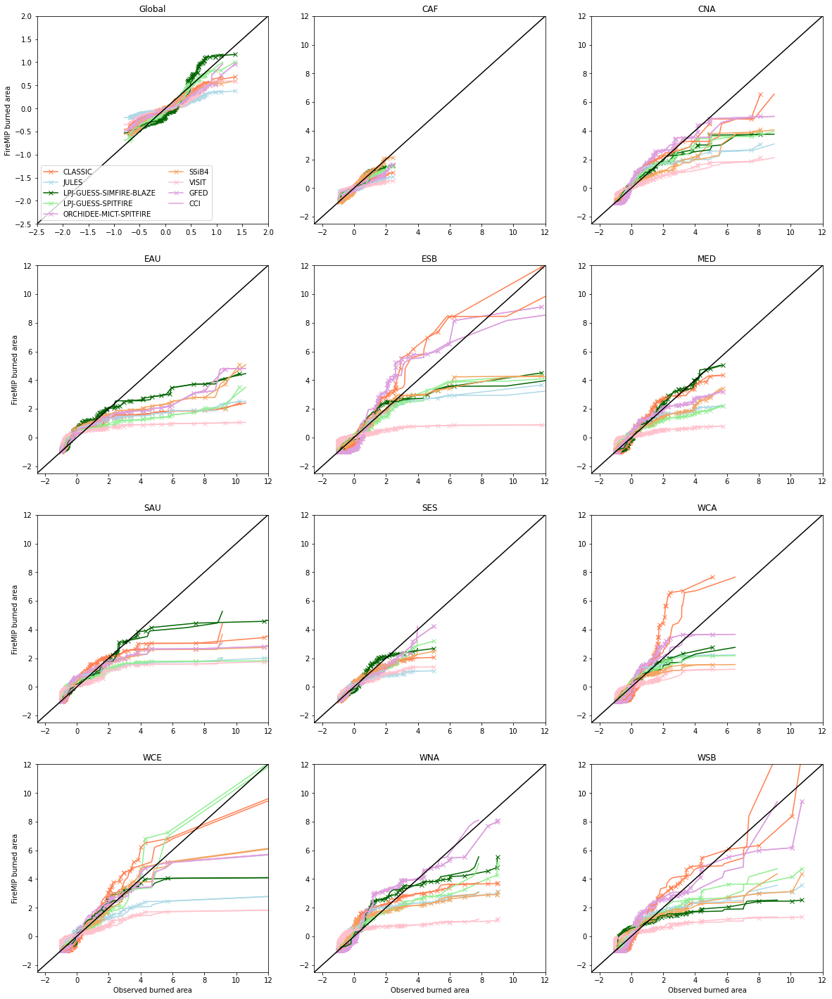

In [185]:
#QQ Plots for selected regions
fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
SelectedRegions = ['CAF', 'CNA', 'EAU', 'ESB', 'MED', 'SAU', 'SES', 'WCA', 'WCE', 'WNA', 'WSB']

for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    for model_name in obsclim_Ranom[regionname].columns:
        ax.plot(np.sort(obs_Ranom[regionname]['GFED_500m']), np.sort(obsclim_Ranom[regionname][model_name]), marker='x', color=model_colours[model_name], label=model_name)
    ax.plot(np.sort(obs_Ranom[regionname]['GFED_500m']), np.sort(obsclim_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), marker='x', color='plum', label='GFED')
    for model_name in obsclim_Ranom[regionname].columns:
        ax.plot(np.sort(obs_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_Ranom[regionname][model_name]), color=model_colours[model_name])
    ax.plot(np.sort(obs_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_Ranom[regionname]['ORCHIDEE-MICT-SPITFIRE']), color='plum', label='CCI')
    axis_min=-2.5
    axix_max=12.0
    ax.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
    ax.set_ylim(axis_min,axix_max)
    ax.set_xlim(axis_min,axix_max)    
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    


ax = axs[0]
for model_name in obsclim_glob_Ranom.columns:
    ax.plot(np.sort(obs_glob_Ranom['GFED_500m']), np.sort(obsclim_glob_Ranom[model_name]), marker='x', color=model_colours[model_name], label=model_name)
ax.plot(np.sort(obs_glob_Ranom['GFED_500m']), np.sort(obsclim_glob_Ranom['ORCHIDEE-MICT-SPITFIRE']), marker='x', color='plum', label='GFED')

for model_name in obsclim_glob_Ranom.columns:
    ax.plot(np.sort(obs_glob_Ranom['FireCCI5.1']), np.sort(obsclim_glob_Ranom[model_name]), color=model_colours[model_name])
ax.plot(np.sort(obs_glob_Ranom['FireCCI5.1']), np.sort(obsclim_glob_Ranom['ORCHIDEE-MICT-SPITFIRE']), color='plum', label='CCI')

axis_min=-2.5
axis_max=2.0
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
ax.set_ylim(axis_min,axis_max)
ax.set_xlim(axis_min,axis_max)    
ax.set_title('Global')
ax.legend(ncol=2)  

for ax in axs[9:12]:
    ax.set_xlabel('Observed burned area') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('FireMIP burned area') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/QQ_Validation/AR6regions_Selected.png',facecolor='w', transparent=False)    
plt.show()

# Trying out spectral plots - monthly, regions, not anomaly

/var/tmp/ipykernel_115992/1429854447.py:7: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1429854447.py:11: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


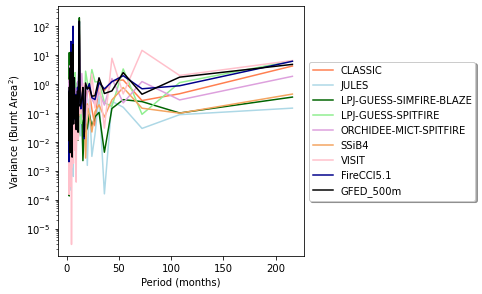

/var/tmp/ipykernel_115992/1429854447.py:34: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1429854447.py:38: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)
/var/tmp/ipykernel_115992/1429854447.py:48: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1429854447.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


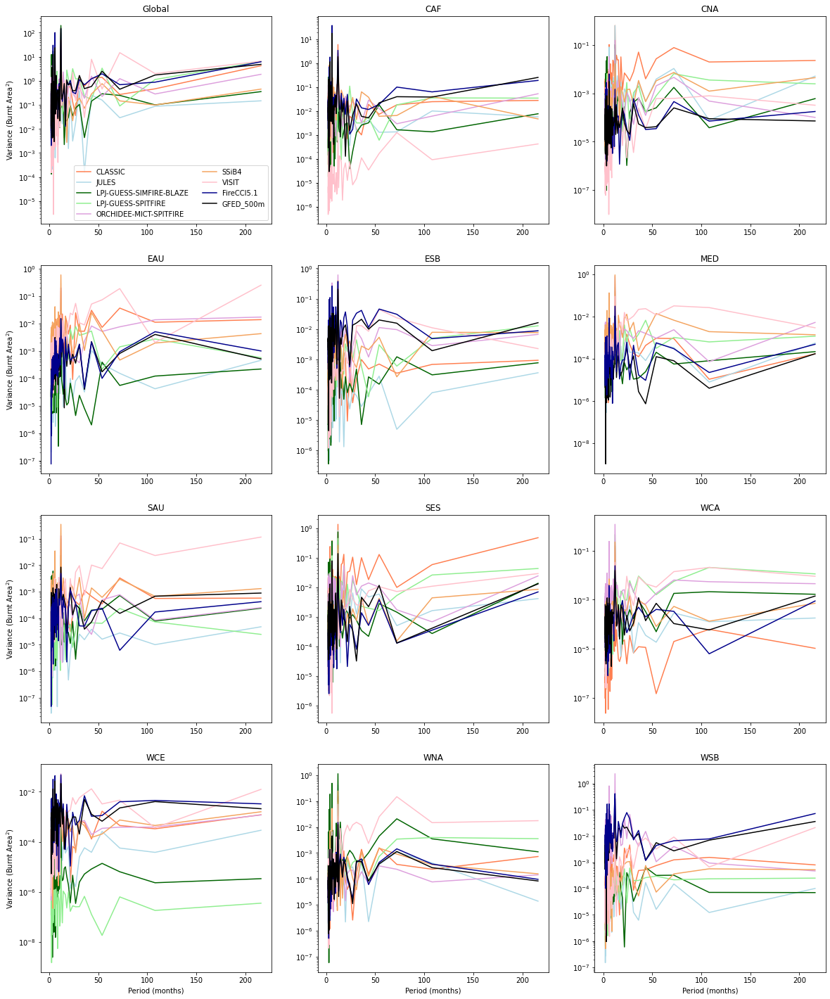

/var/tmp/ipykernel_115992/1429854447.py:78: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1429854447.py:82: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


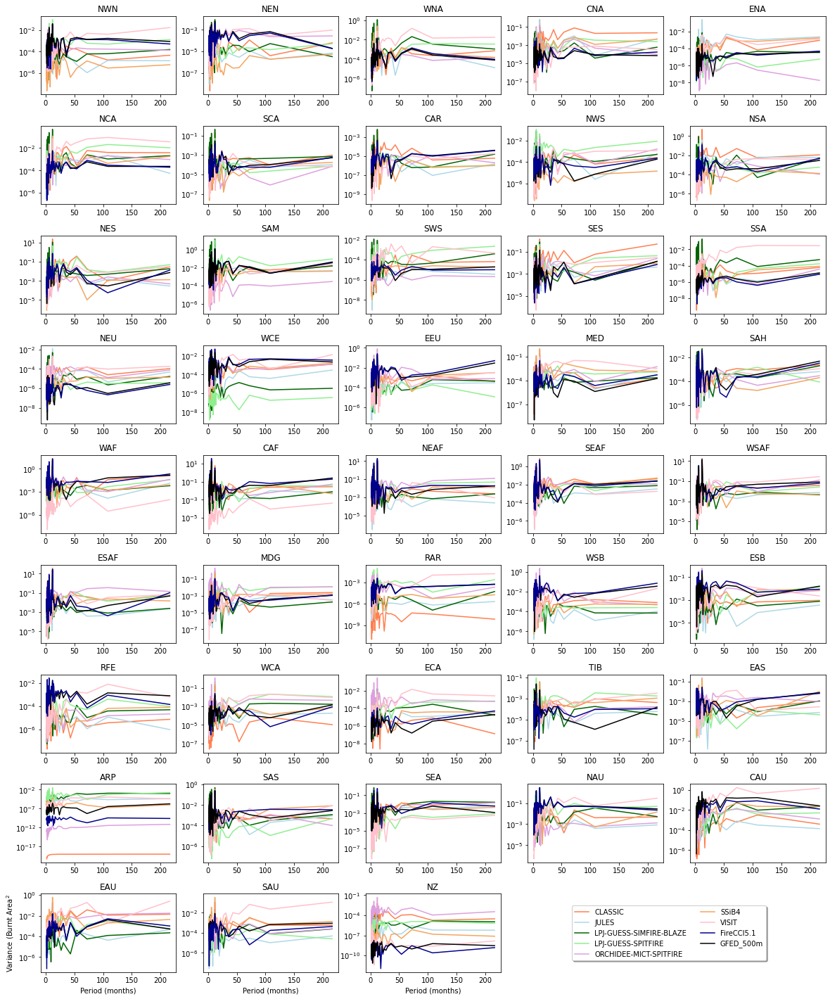

In [233]:
from scipy.signal import periodogram

###One plot for global
ax=plt.subplot(111)
for model_name in obsclim_0219_glob.columns:
    f, sp = periodogram(obsclim_0219_glob[model_name], detrend='constant',scaling='spectrum')
    plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_0219_glob.columns:
    if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_0219_glob[obs_name], detrend='constant',scaling='spectrum')
        plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)        
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.0, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)
plt.tight_layout()
plt.yscale('log')
plt.xlabel('Period (months)')
plt.ylabel('Variance (Burnt Area$^2$)')
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_Global.png',facecolor='w', transparent=False)    
plt.show()




##For Selected Regions 
fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    for model_name in obsclim_0219[regionname].columns: 
        f, sp = periodogram(obsclim_0219[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)     
    for obs_name in obs_0219[regionname].columns:
        if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_0219[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    


ax = axs[0]
for model_name in obsclim_0219_glob.columns:
    f, sp = periodogram(obsclim_0219_glob[model_name], detrend='constant',scaling='spectrum')
    ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_0219_glob.columns:
    if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_0219_glob[obs_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   

ax.set_yscale('log')
ax.set_xlabel(' ')
ax.set_ylabel(' ')   
ax.set_title('Global')
ax.legend(ncol=2)  

for ax in axs[9:12]:
    ax.set_xlabel('Period (months)') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('Variance (Burnt Area$^2$)') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_AR6regions_Selected.png',facecolor='w', transparent=False)    
plt.show()


  
##For ALL Regions 
fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()
for idx, regionname in enumerate(obsclim_0219.columns.unique(level='Region')):
    ax = axs[idx]
    for model_name in obsclim_0219[regionname].columns: 
        f, sp = periodogram(obsclim_0219[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
    for obs_name in obs_0219[regionname].columns:
        if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_0219[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)  
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=2)

for ax in axs[40:44]:
    ax.set_xlabel('Period (months)')
ax = axs[40]
ax.set_ylabel('Variance (Burnt Area$^2$')
plt.subplots_adjust(hspace=0.4)  
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_AR6regions_ALL.png',facecolor='w', transparent=False)
plt.show()





# Power spectra Relative, mothly, regions, realtive anomaly 

/var/tmp/ipykernel_51520/926484460.py:7: RuntimeWarning: divide by zero encountered in divide
  plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_51520/926484460.py:11: RuntimeWarning: divide by zero encountered in divide
  plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


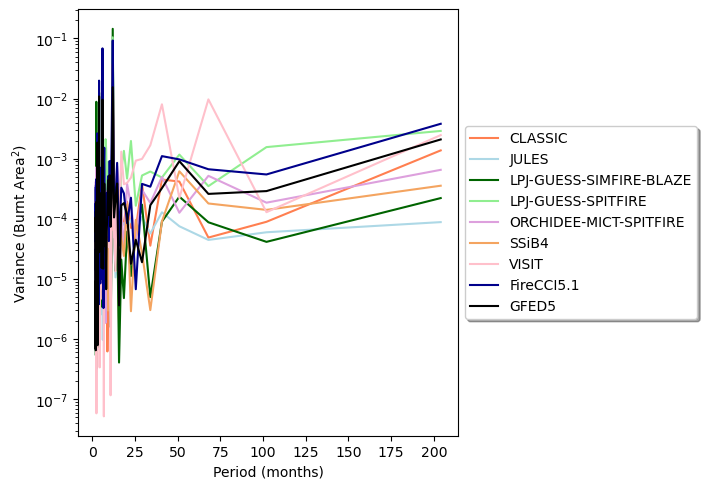

/var/tmp/ipykernel_51520/926484460.py:78: RuntimeWarning: divide by zero encountered in divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_51520/926484460.py:82: RuntimeWarning: divide by zero encountered in divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


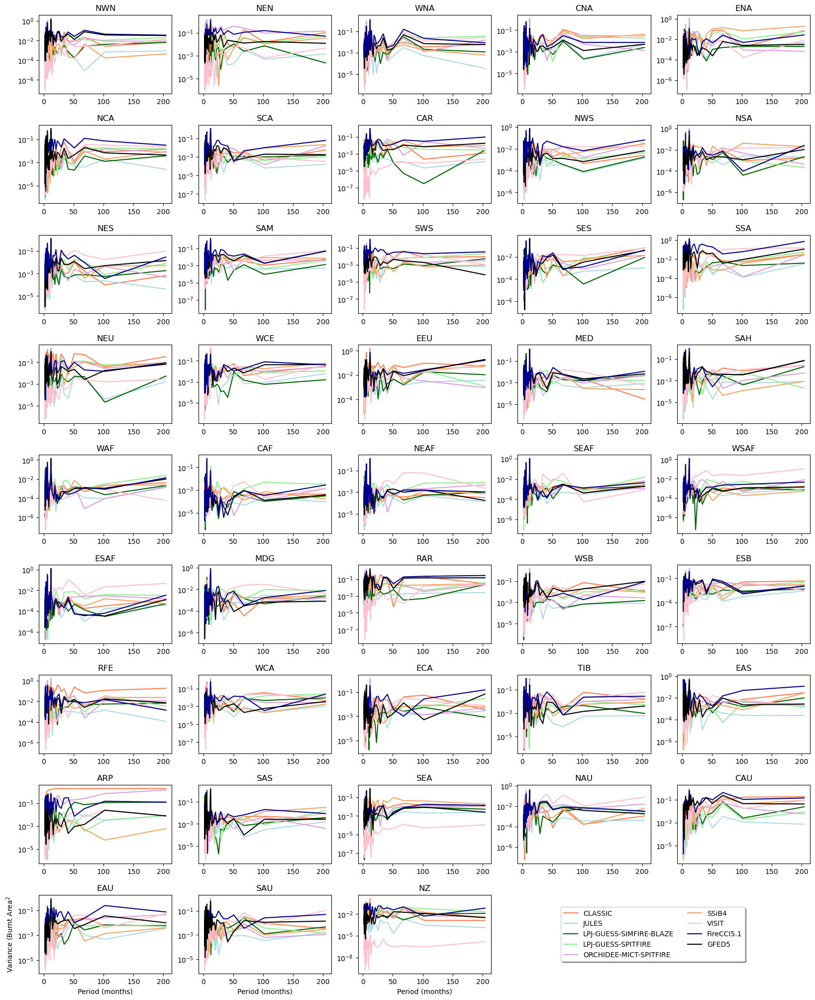

In [93]:
from scipy.signal import periodogram

###One plot for global
ax=plt.subplot(111)
for model_name in obsclim_0319_Ranom_glob.columns:
    f, sp = periodogram(obsclim_0319_Ranom_glob[model_name], detrend='constant',scaling='spectrum')
    plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_0319_Ranom_glob.columns:
    if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_0319_Ranom_glob[obs_name], detrend='constant',scaling='spectrum')
        plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)        
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.0, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)
plt.tight_layout()
plt.yscale('log')
plt.xlabel('Period (months)')
plt.ylabel('Variance (Burnt Area$^2$)')
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_Global_Ranom.png',facecolor='w', transparent=False)    
plt.show()


'''

##For Selected Regions 
fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    for model_name in obsclim_0319_Ranom[regionname].columns: 
        f, sp = periodogram(obsclim_0319_Ranom[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)     
    for obs_name in obs_0319_Ranom[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_0319_Ranom[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    


ax = axs[0]
for model_name in obsclim_0319_Ranom_glob.columns:
    f, sp = periodogram(obsclim_0319_Ranom_glob[model_name], detrend='constant',scaling='spectrum')
    ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_0319_Ranom_glob.columns:
    if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_0319_Ranom_glob[obs_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   

ax.set_yscale('log')
ax.set_xlabel(' ')
ax.set_ylabel(' ')   
ax.set_title('Global')
ax.legend(ncol=2)  

for ax in axs[9:12]:
    ax.set_xlabel('Period (months)') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('Variance (Burnt Area$^2$)') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_AR6regions_Selected_Ranom.png',facecolor='w', transparent=False)    
plt.show()

'''
  
##For ALL Regions 
fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()
for idx, regionname in enumerate(obsclim_0319_Ranom.columns.unique(level='Region')):
    ax = axs[idx]
    for model_name in obsclim_0319_Ranom[regionname].columns: 
        f, sp = periodogram(obsclim_0319_Ranom[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
    for obs_name in obs_0319_Ranom[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_0319_Ranom[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)  
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=2)

for ax in axs[40:44]:
    ax.set_xlabel('Period (months)')
ax = axs[40]
ax.set_ylabel('Variance (Burnt Area$^2$')
plt.subplots_adjust(hspace=0.4)  
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/PowerSpectra_AR6regions_ALL_Ranom.png',facecolor='w', transparent=False)
plt.show()



# Power Spectra annual regional

/var/tmp/ipykernel_115992/1089769365.py:7: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1089769365.py:11: RuntimeWarning: divide by zero encountered in true_divide
  plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


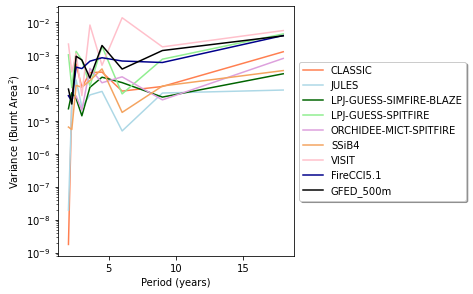

/var/tmp/ipykernel_115992/1089769365.py:34: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1089769365.py:38: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)
/var/tmp/ipykernel_115992/1089769365.py:48: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1089769365.py:52: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


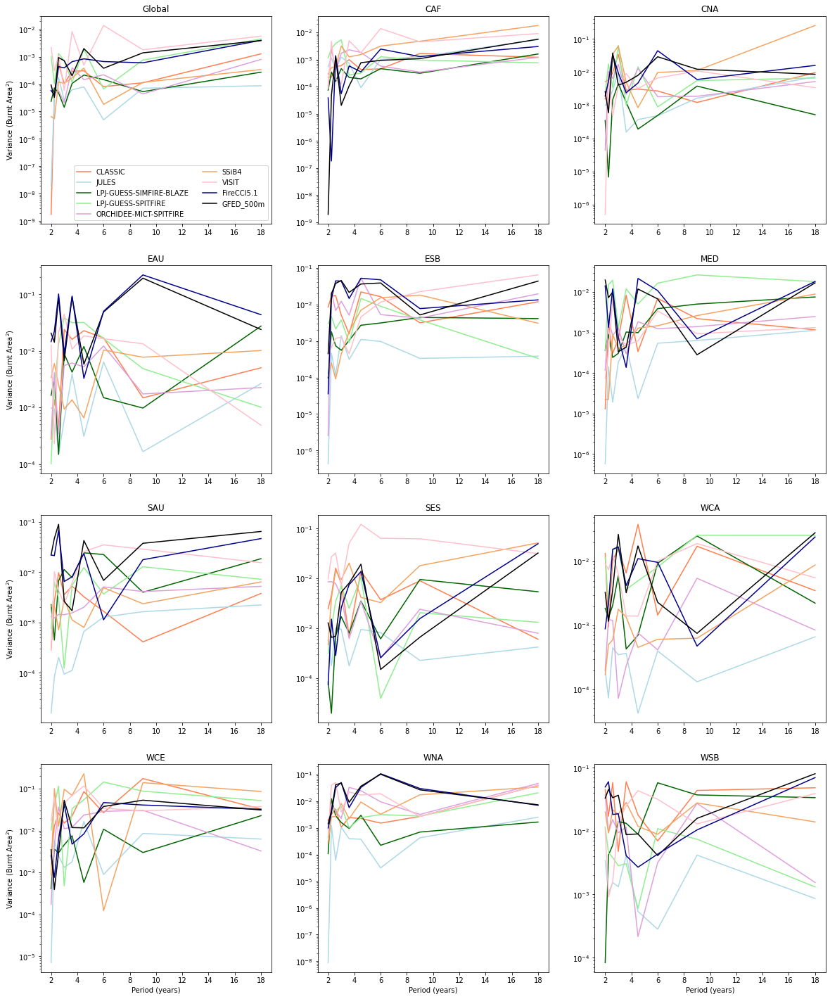

/var/tmp/ipykernel_115992/1089769365.py:78: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_115992/1089769365.py:82: RuntimeWarning: divide by zero encountered in true_divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


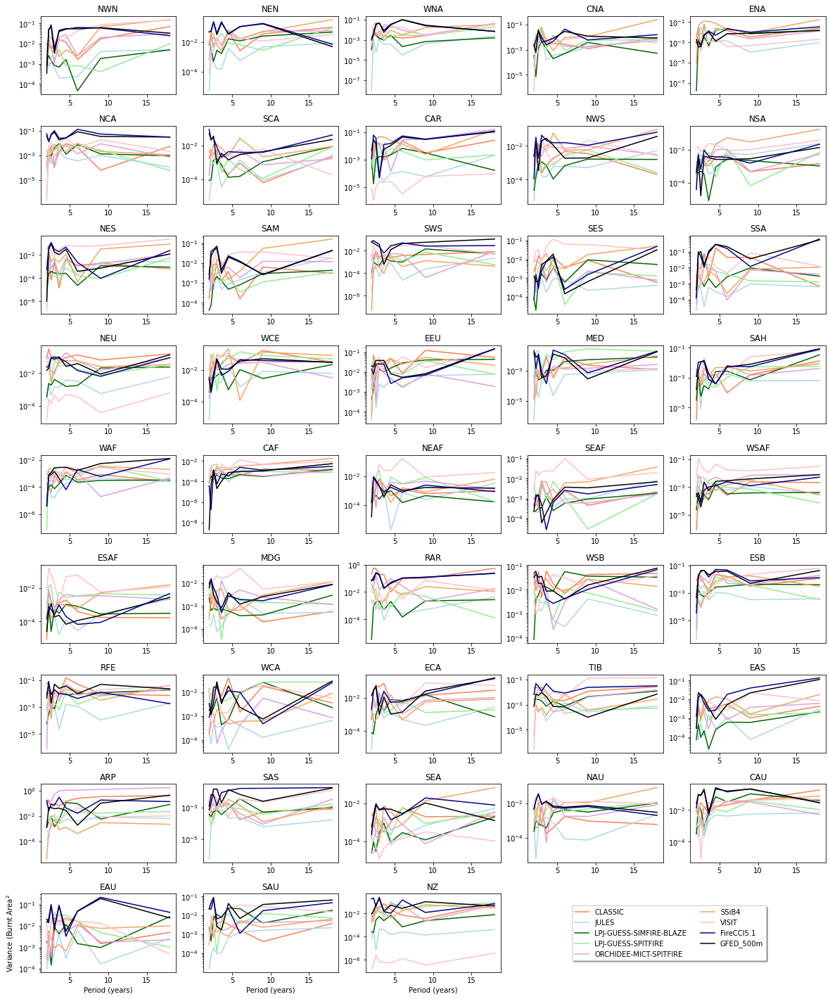

In [223]:
from scipy.signal import periodogram

###One plot for global
ax=plt.subplot(111)
for model_name in obsclim_Ranom.columns:
    f, sp = periodogram(obsclim_Ranom[model_name], detrend='constant',scaling='spectrum')
    plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_Ranom.columns:
    if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_Ranom[obs_name], detrend='constant',scaling='spectrum')
        plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)        
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.0, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)
plt.tight_layout()
plt.yscale('log')
plt.xlabel('Period (years)')
plt.ylabel('Variance (Burnt Area$^2$)')
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_Global_Ranom_Annual.png',facecolor='w', transparent=False)    
plt.show()

#obs_Ranom


##For Selected Regions 
fig, axs = plt.subplots(4, 3, figsize=(20, 25))
axs = axs.ravel()
    
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+1]
    for model_name in obsclim_annual_Ranom[regionname].columns: 
        f, sp = periodogram(obsclim_annual_Ranom[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)     
    for obs_name in obs_annual_Ranom[regionname].columns:
        if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_annual_Ranom[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    


ax = axs[0]
for model_name in obsclim_glob_Ranom.columns:
    f, sp = periodogram(obsclim_Ranom[model_name], detrend='constant',scaling='spectrum')
    ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_Ranom.columns:
    if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_Ranom[obs_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   

ax.set_yscale('log')
ax.set_xlabel(' ')
ax.set_ylabel(' ')   
ax.set_title('Global')
ax.legend(ncol=2)  

for ax in axs[9:12]:
    ax.set_xlabel('Period (years)') 
PlotsNos = [0,3,6,9]   
for ax in axs[PlotsNos]:
    ax.set_ylabel('Variance (Burnt Area$^2$)') 

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_AR6regions_Selected_Ranom_Annual.png',facecolor='w', transparent=False)    
plt.show()


  
##For ALL Regions 
fig, axs = plt.subplots(9, 5, figsize=(20, 25))
axs = axs.ravel()
for idx, regionname in enumerate(obsclim_annual_Ranom.columns.unique(level='Region')):
    ax = axs[idx]
    for model_name in obsclim_annual_Ranom[regionname].columns: 
        f, sp = periodogram(obsclim_annual_Ranom[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
    for obs_name in obs_annual_Ranom[regionname].columns:
        if obs_name == 'GFED_500m' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_annual_Ranom[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)  
    ax.set_yscale('log')
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')    

plt.delaxes(axs[-1])
plt.delaxes(axs[-2])
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax.legend(bbox_to_anchor=(1.5, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=2)

for ax in axs[40:44]:
    ax.set_xlabel('Period (years)')
ax = axs[40]
ax.set_ylabel('Variance (Burnt Area$^2$')
plt.subplots_adjust(hspace=0.4)  
plt.savefig('/scratch/cburton/scratch/ISIMIP3a/PowerSpectra_AR6regions_ALL_Ranom_Annual.png',facecolor='w', transparent=False)
plt.show()


# 3 validation plots globally

/var/tmp/ipykernel_51520/3425087314.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True,
/var/tmp/ipykernel_51520/3425087314.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True,
/var

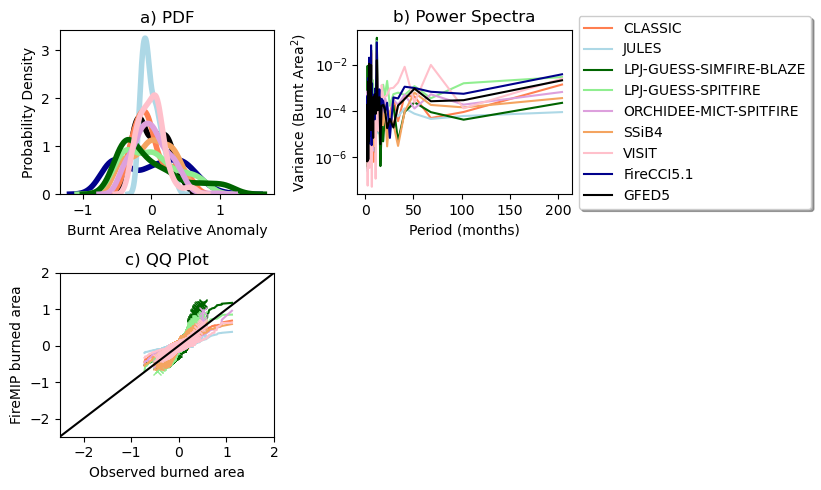

In [106]:
fig = plt.figure(figsize=(8,5))






ax=plt.subplot(2,2,1)
n=1
for Data in AllObs:
    sns.distplot(obs_0319_Ranom_glob[Data], hist=False, kde=True, 
                 bins=int(180/5), color = obscolors[n % len(obscolors)], 
                 hist_kws={'edgecolor':obscolors[n % len(obscolors)]},
                 kde_kws={'linewidth': 4, 'color': obscolors[n % len(obscolors)], 'label':Data})
    n = n+1
n=1
for Data in AllModels:
    sns.distplot(obsclim_0319_Ranom_glob[Data], hist=False, kde=True, 
                 bins=int(180/5), color = modelcolors[n % len(modelcolors)], 
                 hist_kws={'edgecolor':modelcolors[n % len(modelcolors)]},
                 kde_kws={'linewidth': 4, 'color': modelcolors[n % len(modelcolors)], 'label':Data})
    n = n+1

#plt.legend(ncol=1, loc='best')
plt.tight_layout()
plt.xlabel('Burnt Area Relative Anomaly')
plt.ylabel('Probability Density')
plt.title('a) PDF')

ax2=plt.subplot(2,2,2)
for model_name in obsclim_0319_Ranom_glob.columns:
    f, sp = periodogram(obsclim_0319_Ranom_glob[model_name], detrend='constant',scaling='spectrum')
    plt.plot(1./f, sp, color=model_colours[model_name], label=model_name)
for obs_name in obs_0319_Ranom_glob.columns:
    if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
        f, sp = periodogram(obs_0319_Ranom_glob[obs_name], detrend='constant',scaling='spectrum')
        plt.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)        
plt.tight_layout()
#plt.legend(ncol=1, loc='best')
plt.yscale('log')
plt.xlabel('Period (months)')
plt.ylabel('Variance (Burnt Area$^2$)')
plt.title('b) Power Spectra')

box = ax2.get_position()
ax2.set_position([box.x0, box.y0, box.width * 0.9, box.height])
ax2.legend(bbox_to_anchor=(1.0, 0.5), loc="center left",
          fancybox=True, shadow=True, ncol=1)


ax3=plt.subplot(2,2,3)
for model_name in obsclim_0319_Ranom_glob.columns:
    ax3.plot(np.sort(obs_0319_Ranom_glob['GFED5']), np.sort(obsclim_0319_Ranom_glob[model_name]), marker='x', color=model_colours[model_name], label=model_name)
    ax3.plot(np.sort(obs_0319_Ranom_glob['FireCCI5.1']), np.sort(obsclim_0319_Ranom_glob[model_name]), color=model_colours[model_name])
axis_min=-2.5
axis_max=2.0
ax3.set_xlabel('Observed burned area')
ax3.set_ylabel('FireMIP burned area')
ax3.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
ax3.set_ylim(axis_min,axis_max)
ax3.set_xlim(axis_min,axis_max)    
ax3.set_title('c) QQ Plot')
#ax3.legend(ncol=2)  
plt.tight_layout()

plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/Validation_Globally.png',facecolor='w', transparent=False)    
plt.show()

# Selected Regions

/var/tmp/ipykernel_51520/867153909.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/867153909.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  s

/var/tmp/ipykernel_51520/867153909.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})
/var/tmp/ipykernel_51520/867153909.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  s

/var/tmp/ipykernel_51520/867153909.py:47: RuntimeWarning: divide by zero encountered in divide
  ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)
/var/tmp/ipykernel_51520/867153909.py:51: RuntimeWarning: divide by zero encountered in divide
  ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)


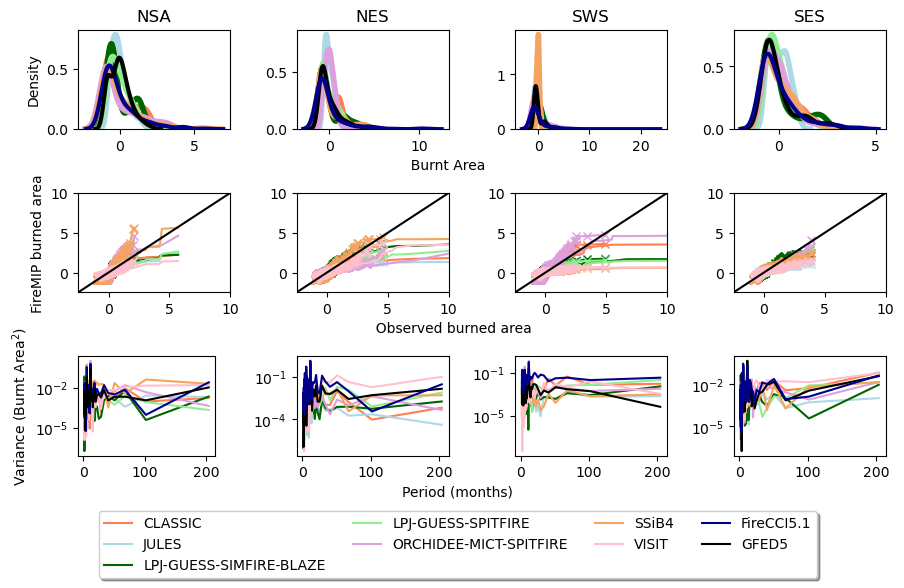

In [251]:
#SelectedRegions = [ 'SES', 'SAU', 'WNA', 'MED',]

SelectedRegions = [ 'NSA','NES', 'SWS','SES']


fig, axs = plt.subplots(3, 4, figsize=(9, 5))
axs = axs.ravel() 

#PDF
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx]
    for model_name in obsclim_0319_Ranom[regionname].columns: 
        if model_name != 'VISIT':    
            data = obsclim_0319_Ranom[regionname][model_name]
            sns.distplot(data, hist=False, kde=True,  label=model_name, ax=ax, kde_kws={'linewidth': 4,'color':model_colours[model_name]})                
    for obs_name in obs_0319_Ranom[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            data = obs_0319_Ranom[regionname][obs_name]
            sns.distplot(data, hist=False, kde=True, label=obs_name, ax=ax, kde_kws={'linewidth': 3,'color':obs_colours[obs_name]})
    ax.set_title(regionname)
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ') 
    plt.tight_layout()

    
#QQ    
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+4]
    for model_name in obsclim_0319_Ranom[regionname].columns:
        ax.plot(np.sort(obs_0319_Ranom[regionname]['GFED5']), np.sort(obsclim_0319_Ranom[regionname][model_name]), marker='x', color=model_colours[model_name], label=model_name)
        ax.plot(np.sort(obs_0319_Ranom[regionname]['FireCCI5.1']), np.sort(obsclim_0319_Ranom[regionname][model_name]), color=model_colours[model_name])
    axis_min=-2.5
    axix_max=10.0
    ax.plot([axis_min,axix_max],[axis_min,axix_max],color="k")
    ax.set_ylim(axis_min,axix_max)
    ax.set_xlim(axis_min,axix_max)    
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ') 
    

##power
   
for idx, regionname in enumerate(SelectedRegions):
    ax = axs[idx+8]
    for model_name in obsclim_0319_Ranom[regionname].columns: 
        f, sp = periodogram(obsclim_0319_Ranom[regionname][model_name], detrend='constant',scaling='spectrum')
        ax.plot(1./f, sp, color=model_colours[model_name], label=model_name)     
    for obs_name in obs_0319_Ranom[regionname].columns:
        if obs_name == 'GFED5' or obs_name == 'FireCCI5.1':
            f, sp = periodogram(obs_0319_Ranom[regionname][obs_name], detrend='constant',scaling='spectrum')
            ax.plot(1./f, sp, color=obs_colours[obs_name], label=obs_name)   
    ax.set_yscale('log')
    ax.set_xlabel(' ') 
    ax.set_ylabel(' ')

box = axs[8].get_position()
axs[8].set_position([box.x0, box.y0, box.width * 0.9, box.height])
axs[8].legend(bbox_to_anchor=(0.1, -1.3), loc="lower left",
          fancybox=True, shadow=True, ncol=4)

axs[0].set_ylabel('Density')     
axs[4].set_ylabel('FireMIP burned area')
axs[8].set_ylabel('Variance (Burnt Area$^2$)') 

axs[1].set_xlabel('                          Burnt Area', loc="left")     
axs[5].set_xlabel('                  Observed burned area', loc="left")     
axs[9].set_xlabel('                        Period (months)', loc="left")     


plt.savefig('/scratch/cburton/scratch/ISIMIP3a/Draft1.0/Validation_4Regions_SAM.png',facecolor='w', transparent=False)    
plt.show()

    